# Mini-Project n°3 - ViT vs CNN

L'objectif de ce projet est de comparer les performances entre deux architectures différentes pour la calssification, Visual Transformer (ViT) et Convolutional Neural Network (CNN).

Ce notebook présente tout d'abord l'architecure ViT, basée sur le Transformer. Ensuite, il présente les datasets utilisés dans le projet, et pourquoi ils ont été choisis. Les différentes architectures de ViT et CNN seront aussi présentées et justifiées.

Nous comparerons également après les entraînements les performances des différents modèles sur les datasets pour voir dans quels contextes certains sont meilleurs que les autres. 

Finalement nous comparerons nos analyses aux résultats issus de la littérature scientifique.

# Présentation de l'architecture ViT

L’architecture Vision Transformer, aussi appelée ViT, est une architecture de deep learning qui utilise Transformer, vue en cours, sur des images au lieu de texte. L’objectif de cette méthode est d’utiliser le mécanisme de self-attention, afin que le modèle capture les relations entre les différentes parties de l’image, pour avoir une compréhension globale de son ensemble.
Dans un premier temps, ViT traite une image comme une suite de patch de même taille pour appliquer la self-attention entre eux, ce qui permet d’obtenir des relations entre les différentes parties de cette image. Cela permet ainsi de ne pas utiliser des opérations de convolutions, contrairement au CNN.

La première étape de la pipeline ViT est de transformer une image en une grille de patchs, c’est l’image patching. Ces patchs sont traités dans le Transformer comme des tokens, en étant aplatis en un seul vecteur. Cet aplatissement a pour effet de retirer les dimensions spatiales de l’image, mais cela permet au modèle de traiter uniformément chaque patch. Ensuite, le patch embedding permet de projeter linéairement les patchs dans un espace d’embedding, pour permettre au modèle d’apprendre les features de l’image.

Afin de conserver la position de chacun des patchs dans l’image, le positional encoding est utilisé, tout comme dans le transformer classique. Cela permet au modèle d’apprendre les relations globales et locales des features sur les images.
Un token de Classification (CLS Token) est également ajouté, afin de récupérer à la fin de la pipeline, l’ensemble des informations issues de l’image, pour être utilisé dans la classification finale de l’image.
Avant d’entrer dans les blocs de l’encoder, les différents vecteurs d’embedding sont normalisés pour éviter les problème d’exploding et vanishing gradient.

Tout comme l’architecture Transformer classique, les vecteurs d’embedding passent ensuite dans plusieurs têtes d’attention. Chaque vecteur d’embedding est multiplié par les matrices apprises $W_Q$, $W_K$ et $W_V$, pour obtenir des matrices de Query, Key et Value. L’attention est ensuite calculée grâce à ces matrices, par la formule suivante :

Ce mécanisme a lieu dans plusieurs têtes d’attention pour capturer différents types de relations entre les features de l’image. Les résultats de chacune de ces têtes sont concaténés puis multipliés par une matrice $W_O$ pour obtenir un nouveau vecteur d’embedding.

Ce nouveau vecteur est additionné avec celui qui est entré dans la tête d’attention, puis normalisé, avant de passer dans un Feed Forward Network utilisant deux couches denses et la fonction d’activation GeLu. Chaque token passe indépendamment des autres dans ce FFN, pour effectuer des transformations non linéaires et ainsi amplifier les informations contenues par le vecteur.

Finalement, en sortie de l’encodeur, une tête de classification récupère le token de classification CLS pour le convertir en probabilité de classe, en utilisant un petit FFN. Les logits obtenus sont convertis en probabilités normalisées, et en utilisant la probabilités maximale, l’image est classifiée.

![Schéma ViT](vit_architecture.jpg)

### Import des packages

In [1]:
import os
import random
import math
from collections import Counter
import time
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report
import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader, random_split, Subset, ConcatDataset
import torchvision
import torchvision.transforms as transforms
from torchvision.datasets import ImageFolder
from PIL import Image
from tqdm.auto import tqdm
from torchinfo import summary
from sklearn.decomposition import PCA
from datasets import load_dataset
from captum.attr import IntegratedGradients, LayerGradCam, Saliency
from captum.attr import visualization as viz

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(f"Utilisation de : {device}")

Utilisation de : cuda


### Fonctions auxiliaires pour exploration des datasets

Les fonctions suivantes sont utilisées pour afficher différentes informations sur les datasets utilisés pour cette étude.

In [2]:
BATCH_SIZE = 32
SEED = 0
def apply_transforms(examples):   
    # On applique la transformation à chaque image du batch
    examples["pixel_values"] = [transform(img.convert("RGB")) for img in examples["image"]]
    return examples

In [3]:
def count_trainable_params(model):
    return sum(p.numel() for p in model.parameters() if p.requires_grad)

def dataset_targets(ds):
    """Retourne la liste des labels (int) d'un Dataset ou Subset(random_split)."""
    if hasattr(ds, "targets"): 
        return list(ds.targets)
    if hasattr(ds, "dataset") and hasattr(ds, "indices"):  
        base_targets = ds.dataset.targets
        return [base_targets[i] for i in ds.indices]
    raise TypeError(f"Unsupported dataset type: {type(ds)}")

def print_dataset_report(name, full_ds, train_ds, val_ds, test_ds, train_loader, val_loader, test_loader):
    print("\n" + "="*80)
    print(f"DATASET REPORT — {name}")
    print("="*80)

    # Infos globales
    print(f"Root dataset type: {type(full_ds).__name__}")
    print(f"Num classes: {len(full_ds.classes)}")
    print("Classes:", full_ds.classes)
    print(f"Total images: {len(full_ds)}")
    print(f"Split sizes: train={len(train_ds)} | val={len(val_ds)} | test={len(test_ds)}")

    # Distribution classes
    tr = Counter(dataset_targets(train_ds))
    va = Counter(dataset_targets(val_ds))
    te = Counter(dataset_targets(test_ds))

    # mapping idx->class
    idx2class = {i: c for i, c in enumerate(full_ds.classes)}

    def fmt(counter, top_k=None):
        items = [(idx2class[k], v) for k, v in counter.items()]
        items.sort(key=lambda x: (-x[1], x[0]))
        if top_k is not None:
            items = items[:top_k]
        return ", ".join([f"{c}:{v}" for c, v in items])

    print("\nClass distribution (counts):")
    print("  Train:", fmt(tr))
    print("  Val  :", fmt(va))
    print("  Test :", fmt(te))

    # Exemple batch
    xb, yb = next(iter(train_loader))
    print("\nOne train batch:")
    print(f"  images: shape={tuple(xb.shape)} dtype={xb.dtype} min={xb.min().item():.3f} max={xb.max().item():.3f}")
    print(f"  labels: shape={tuple(yb.shape)} dtype={yb.dtype} min={yb.min().item()} max={yb.max().item()}")
    print(f"  expected label range: 0..{len(full_ds.classes)-1}")

    # DataLoader params utiles
    print("\nDataloaders:")
    print(f"  batch_size={train_loader.batch_size} | num_workers={train_loader.num_workers} | pin_memory={train_loader.pin_memory}")
    print(f"  train batches/epoch={len(train_loader)} | val batches={len(val_loader)} | test batches={len(test_loader)}")


Les fonctions définies ci-dessus permettent d'effectuer un rapport complet sur le dataset, les splits, et les dataloaders.

In [4]:
def plot_pixel_distribution_per_class(dataset, n_samples_per_class=100):
    classes = dataset.classes
    num_classes = len(classes)
    
    # Création d'une grille de sous-graphiques 
    fig, axes = plt.subplots(2, 5, figsize=(20, 10), sharex=True, sharey=True)
    axes = axes.flatten()

    print(f"Calcul des distributions pour {n_samples_per_class} images par classe...")

    for i, class_name in enumerate(classes):
        # 1. Récupérer les indices de la classe i
        indices = [idx for idx, target in enumerate(dataset.targets) if target == i]
        # Échantillonnage pour ne pas saturer la mémoire
        selected_indices = np.random.choice(indices, min(len(indices), n_samples_per_class), replace=False)
        
        all_r, all_g, all_b = [], [], []
        
        for idx in selected_indices:
            img, _ = dataset[idx]
            # On récupère les pixels par canal
            all_r.extend(img[0].flatten().numpy())
            all_g.extend(img[1].flatten().numpy())
            all_b.extend(img[2].flatten().numpy())

        # 2. Affichage sur le subplot correspondant
        axes[i].hist(all_r, bins=50, color='red', alpha=0.3, label='R', density=True)
        axes[i].hist(all_g, bins=50, color='green', alpha=0.3, label='G', density=True)
        axes[i].hist(all_b, bins=50, color='blue', alpha=0.3, label='B', density=True)
        
        axes[i].set_title(f"Classe: {class_name}")
        if i == 0: axes[i].legend()

    plt.suptitle("Comparaison des distributions de pixels par classe (Normalisées)", fontsize=16)
    plt.tight_layout(rect=[0, 0.03, 1, 0.95])
    plt.show()

Ici, cette fonction permet d'afficher la distribution des pixels des images en fonction des différentes classes. Cela permet de voir si des classes possèdent des patterns de couleur (images très obscures ou claires) qui pourraient aider les images à être classifiées.

In [5]:
def plot_mean_images(dataset):
    classes = dataset.classes
    fig, axes = plt.subplots(2, 5, figsize=(15, 7))
    axes = axes.flatten()
    
    for i, class_name in enumerate(classes):
        # On récupère les indices des images de cette classe
        indices = [idx for idx, target in enumerate(dataset.targets) if target == i]
        
        # On charge les images 
        imgs = []
        for idx in indices[:500]:
            img, _ = dataset[idx]
            imgs.append(img)
        
        # Calcul de la moyenne sur le batch d'images
        mean_img = torch.stack(imgs).mean(0)
        
        # Denormalisation pour l'affichage
        mean_img = mean_img / 2 + 0.5
        axes[i].imshow(mean_img.permute(1, 2, 0).numpy())
        axes[i].set_title(class_name)
        axes[i].axis('off')
        
    plt.tight_layout()
    plt.show()

La fonction définie ci-dessus permet d'afficher une image moyenne pour chacune des classes. L'image moyenne permet de voir si des caractéristiques se retrouvent dans des endroits similaires sur toutes les images d'une classe.

In [6]:

def plot_pca_distribution_fixed(dataset, n_samples=1000):
    # Générer des indices aléatoires pour avoir toutes les classes
    indices = np.random.choice(len(dataset), n_samples, replace=False)
    
    data = []
    labels = []
    
    for idx in indices:
        img, label = dataset[idx]
        data.append(img.view(-1).numpy())
        # On récupère le nom de la classe via l'attribut classes du dataset
        labels.append(dataset.classes[label])
    
    data = np.array(data)
    
    pca = PCA(n_components=2)
    pca_result = pca.fit_transform(data)
    
    df = pd.DataFrame({
        'PCA1': pca_result[:, 0],
        'PCA2': pca_result[:, 1],
        'Classe': labels
    })
    
    plt.figure(figsize=(12, 8))
    
    sns.scatterplot(data=df, x='PCA1', y='PCA2', hue='Classe', 
                    palette='tab10', alpha=0.7, 
                    hue_order=dataset.classes)
    plt.title(f"Projection PCA (Échantillonnage aléatoire de {n_samples} images)")
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.tight_layout()
    plt.show()


On affiche ici une PCA des données des différentes classes sur 2 dimensions.

# Dataset Vehicles


Ce dataset est issu de kaggle. Il regroupe un ensemble d'images de taille 128x128. C'est un petit dataset de véhicules, classifiés en fonction de leur type. Il s'agit d'un moyen de tester dans un premier temps les performances des deux architectures sur peu de données, afin de voir si l'un se démarque de l'autre.

In [8]:
DATA_DIR_V = "Vehicles" 
IMG_SIZE_V = 128


transform = transforms.Compose([
    transforms.Lambda(lambda img: img.convert("RGB")),
    transforms.Resize((IMG_SIZE_V, IMG_SIZE_V)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5]),
])

full_ds_v = ImageFolder(root=DATA_DIR_V, transform=transform)

NUM_CLASSES_V = len(full_ds_v.classes)


# Split 80/10/10 sur indices
torch.manual_seed(SEED)
n = len(full_ds_v)
n_train = int(0.8 * n)
n_val   = int(0.1 * n)
n_test  = n - n_train - n_val

train_idx, val_idx, test_idx = random_split(range(n), [n_train, n_val, n_test])


train_ds_v = Subset(full_ds_v, train_idx.indices)
val_ds_v   = Subset(full_ds_v, val_idx.indices)
test_ds_v  = Subset(full_ds_v, test_idx.indices)

train_loader_v = DataLoader(train_ds_v, batch_size=BATCH_SIZE, shuffle=True,  num_workers=0, pin_memory=True)
val_loader_v   = DataLoader(val_ds_v,   batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)
test_loader_v  = DataLoader(test_ds_v,  batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)



In [9]:
print_dataset_report(
    name="Vehicles",
    full_ds=full_ds_v,
    train_ds=train_ds_v,
    val_ds=val_ds_v,
    test_ds=test_ds_v,
    train_loader=train_loader_v,
    val_loader=val_loader_v,
    test_loader=test_loader_v
)


DATASET REPORT — Vehicles
Root dataset type: ImageFolder
Num classes: 7
Classes: ['Auto Rickshaws', 'Bikes', 'Cars', 'Motorcycles', 'Planes', 'Ships', 'Trains']
Total images: 5589
Split sizes: train=4471 | val=558 | test=560

Class distribution (counts):
  Train: Trains:657, Cars:650, Motorcycles:649, Bikes:642, Ships:642, Planes:616, Auto Rickshaws:615
  Val  : Auto Rickshaws:96, Planes:94, Ships:82, Bikes:81, Motorcycles:77, Trains:68, Cars:60
  Test : Auto Rickshaws:89, Planes:89, Cars:80, Bikes:77, Ships:76, Trains:75, Motorcycles:74

One train batch:
  images: shape=(32, 3, 128, 128) dtype=torch.float32 min=-1.000 max=1.000
  labels: shape=(32,) dtype=torch.int64 min=0 max=6
  expected label range: 0..6

Dataloaders:
  batch_size=32 | num_workers=0 | pin_memory=True
  train batches/epoch=140 | val batches=18 | test batches=18


Ce rapport de dataset regroupe l'ensemble des classes présentes dans le data set, ici des tuk-tuk, des vélos, des voitures, des motos, des avions, des bateaux et des trains. On a bien séparé les données en train, validation et test set, puis crée des dataloaders de taille 32.

### Analyse exploratoire du dataset Vehicules

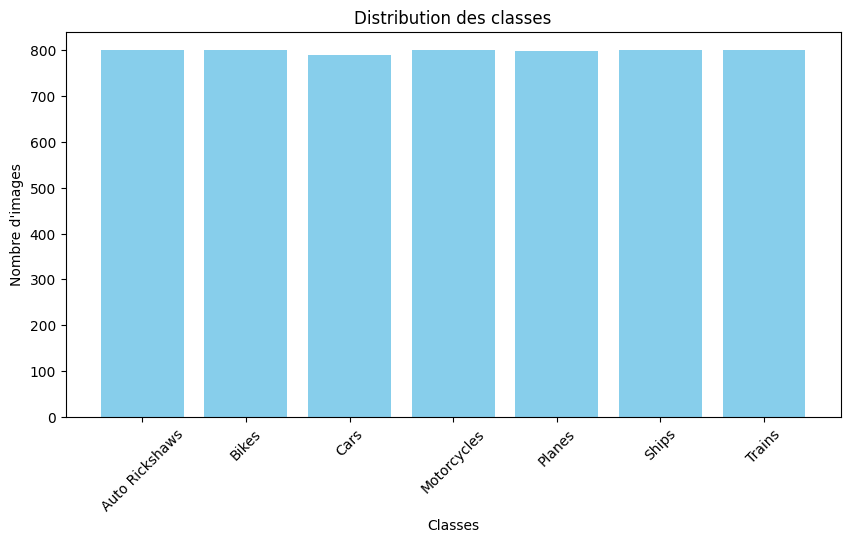

In [10]:
def plot_class_distribution(dataset, title="Distribution des classes"):
   
    counts = Counter(dataset.targets)
    class_names = dataset.classes
    labels = [class_names[i] for i in counts.keys()]
    values = list(counts.values())

    plt.figure(figsize=(10, 5))
    plt.bar(labels, values, color='skyblue')
    plt.xlabel('Classes')
    plt.ylabel('Nombre d\'images')
    plt.title(title)
    plt.xticks(rotation=45)
    plt.show()

plot_class_distribution(full_ds_v)

Le nombre d'éléments dans chaque classe semble bien équilibré.

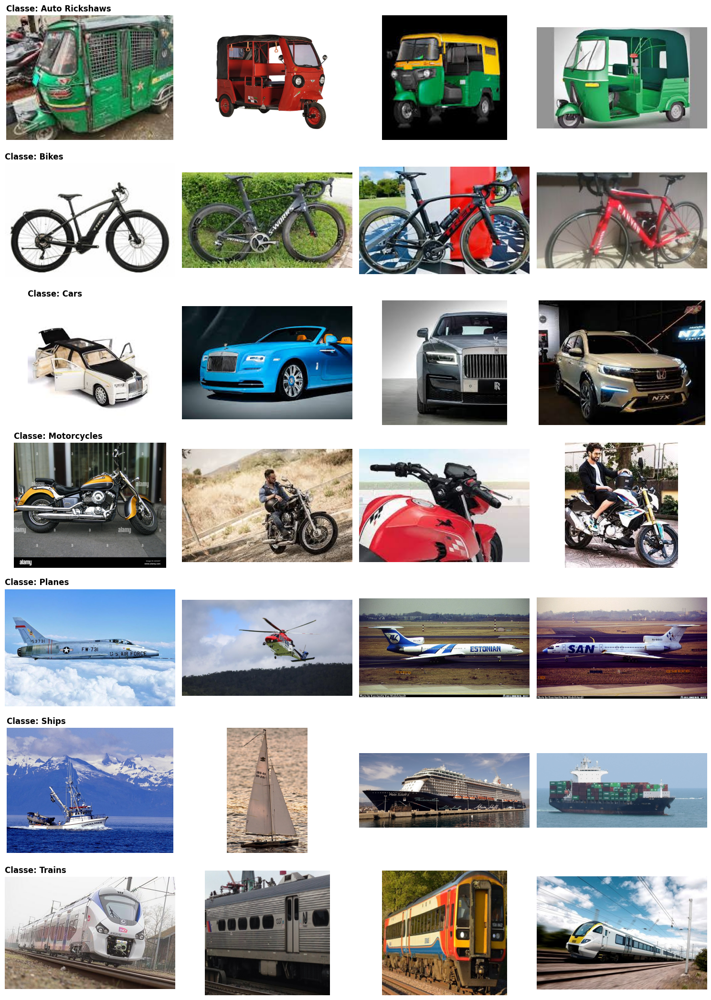

In [11]:

n_samples=4

n_samples = 4
fig, axes = plt.subplots(NUM_CLASSES_V, n_samples, figsize=(15, 3 * NUM_CLASSES_V))

for i, class_name in enumerate(full_ds_v.classes):
    class_path = os.path.join(DATA_DIR_V, class_name)
    image_names = [f for f in os.listdir(class_path) if f.lower().endswith(('.png','.jpg','.jpeg','.bmp','.webp'))]

    samples = random.sample(image_names, min(n_samples, len(image_names)))

    for j in range(n_samples):
        ax = axes[i, j]
        ax.axis('off')

        if j < len(samples):
            img_path = os.path.join(class_path, samples[j])
            img = Image.open(img_path).convert("RGB")
            ax.imshow(img)

        if j == 0:
            ax.set_title(f"Classe: {class_name}", loc="left", fontweight="bold")

plt.tight_layout()
plt.show()

Calcul des distributions pour 100 images par classe...


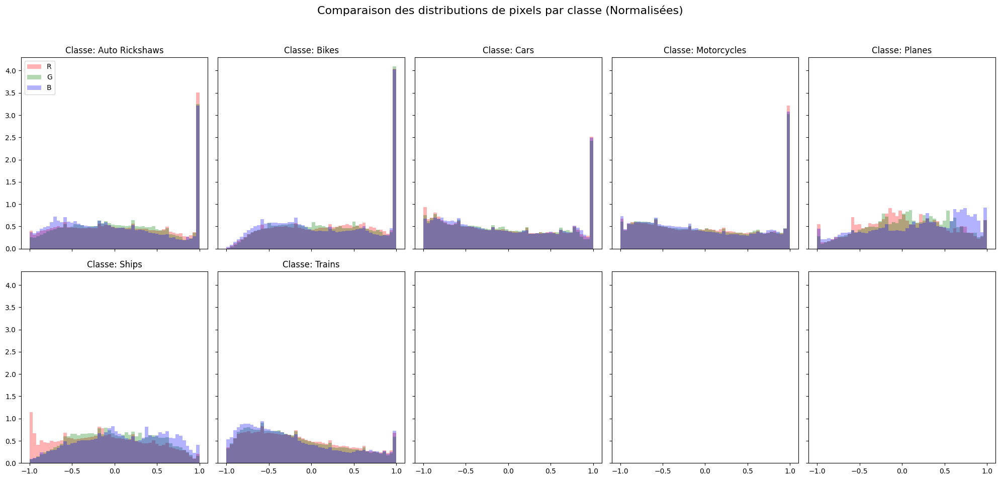

In [12]:
plot_pixel_distribution_per_class(full_ds_v)

On affiche la distribution de pixels par classe, pour observer si certaines images se démarquent par rapport aux autres. Dans ce cas, les distributions semblent très similaires entre les classes, donc la distribution des couleurs ne jouera surement pas un rôle très importants pour classer les images.

/home/fonsecag/.conda/envs/HDDLtorch/lib/python3.12/site-packages/PIL/Image.py:1047: UserWarning: Palette images with Transparency expressed in bytes should be converted to RGBA images
  warnings.warn(


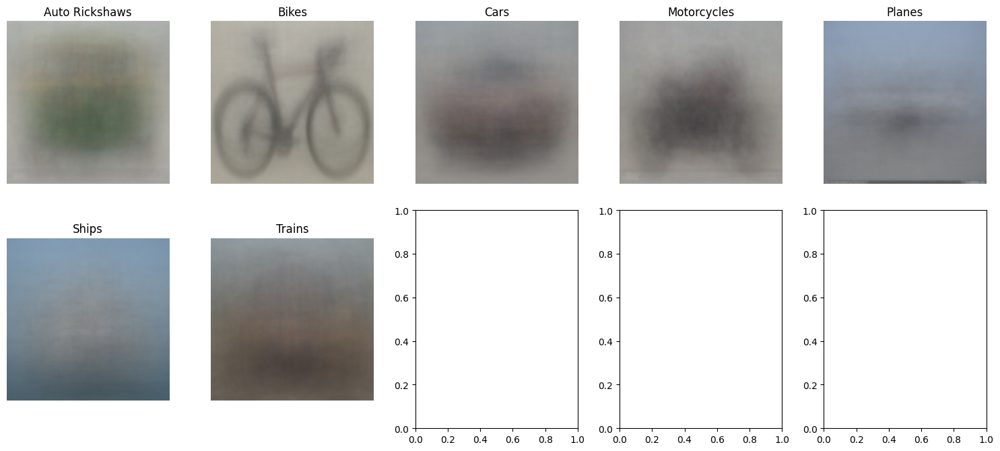

In [13]:
plot_mean_images(full_ds_v)

En affichant l'image moyenne de chacune des classes, on remarque que les images de vélos semblent très similaires, car la silhouette est clairement reconnaissable. Pour les classes d'avions et de bateaux, le fond bleu ressort beaucoup. Cela parait cohérent, puisque ces deux types de véhicules sont présents dans le ciel et la mer en général. Aussi, le jaune et le vert des tuk-tuk ressortent beaucoup. Ainsi, on peut penser que la disposition des pixels dans l'image et certaines couleurs pourront jouer un rôle important dans leur classification.

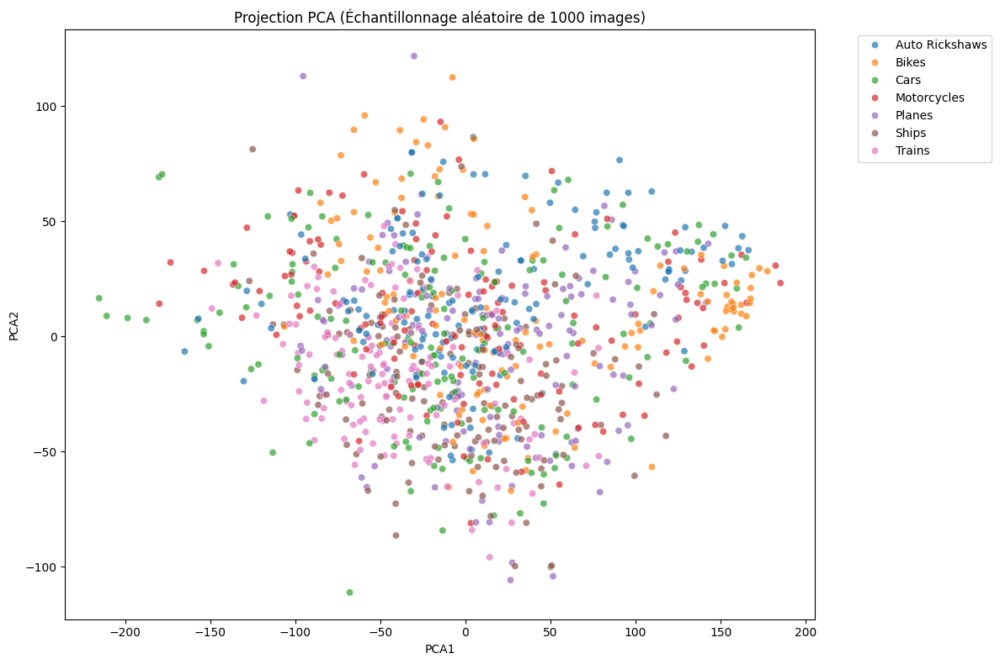

In [14]:
plot_pca_distribution_fixed(full_ds_v)

La PCA appliquée aux pixels bruts du dataset Vehicles montre un fort recouvrement entre classes ce qui veut dire que les catégories ne sont pas séparables linéairement dans l’espace des pixels.

# Dataset Garbage

Ce deuxième dataset est plus gros que le premier. Il est également issu de Kaggle et représente différents types de déchets triés par catégories. Les images sont plutôt grandes, avec une taille de 128x128, comme précédemment.

In [16]:
IMG_SIZE_GAR = 128
BATCH_SIZE = 32
SEED = 0

def pil_loader_rgb(path):
    with Image.open(path) as img:
        return img.convert("RGB")

train_dir_gar = "Garbage"

transform = transforms.Compose([
    transforms.Resize((IMG_SIZE_GAR, IMG_SIZE_GAR)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5]),
])

full_ds_gar = ImageFolder(root=train_dir_gar, transform=transform, loader=pil_loader_rgb)
NUM_CLASSES_GAR = len(full_ds_gar.classes)


torch.manual_seed(SEED)
n = len(full_ds_gar)
n_train = int(0.8 * n)
n_val   = int(0.1 * n)
n_test  = n - n_train - n_val

train_ds_gar, val_ds_gar, test_ds_gar = random_split(full_ds_gar, [n_train, n_val, n_test])


train_loader_gar = DataLoader(train_ds_gar, batch_size=BATCH_SIZE, shuffle=True,  num_workers=0, pin_memory=True)
val_loader_gar   = DataLoader(val_ds_gar,   batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)
test_loader_gar  = DataLoader(test_ds_gar,  batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)

### Analyse exploratoire du dataset Garbage

In [17]:
print_dataset_report(
    name="Garbage",
    full_ds=full_ds_gar,
    train_ds=train_ds_gar,
    val_ds=val_ds_gar,
    test_ds=test_ds_gar,
    train_loader=train_loader_gar,
    val_loader=val_loader_gar,
    test_loader=test_loader_gar
)


DATASET REPORT — Garbage
Root dataset type: ImageFolder
Num classes: 10
Classes: ['battery', 'biological', 'cardboard', 'clothes', 'glass', 'metal', 'paper', 'plastic', 'shoes', 'trash']
Total images: 20212
Split sizes: train=16169 | val=2021 | test=2022

Class distribution (counts):
  Train: clothes:4289, glass:2560, plastic:1682, shoes:1560, cardboard:1488, paper:1413, metal:867, biological:786, battery:764, trash:760
  Val  : clothes:498, glass:310, plastic:224, shoes:202, cardboard:196, paper:182, biological:115, metal:105, trash:100, battery:89
  Test : clothes:540, glass:328, shoes:215, paper:192, plastic:189, cardboard:168, metal:104, trash:99, biological:96, battery:91

One train batch:
  images: shape=(32, 3, 128, 128) dtype=torch.float32 min=-1.000 max=1.000
  labels: shape=(32,) dtype=torch.int64 min=0 max=9
  expected label range: 0..9

Dataloaders:
  batch_size=32 | num_workers=0 | pin_memory=True
  train batches/epoch=506 | val batches=64 | test batches=64


Comme précédemment, nous avons séparés en différents sets d'entraînement, de test et d'évaluation.

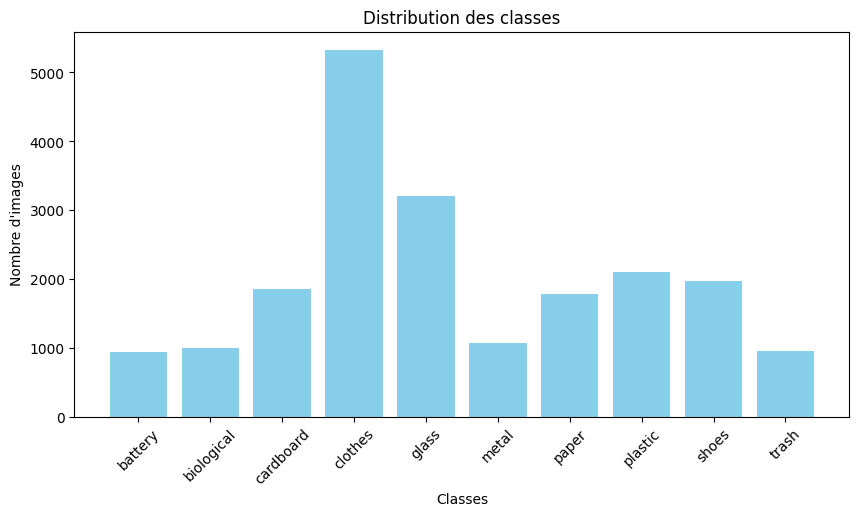

In [18]:
plot_class_distribution(full_ds_gar)

Ici on observe que les classes ne sont pas tout à fait équilibrées. La classe majoritaire est clothes et la minoritaire sont trash et battery. Ce dataset va nous permettre de tester les performances des architectures avec un dataset déséquilibrés, afin de voir si l'un se démarque par rapport à l'autre.

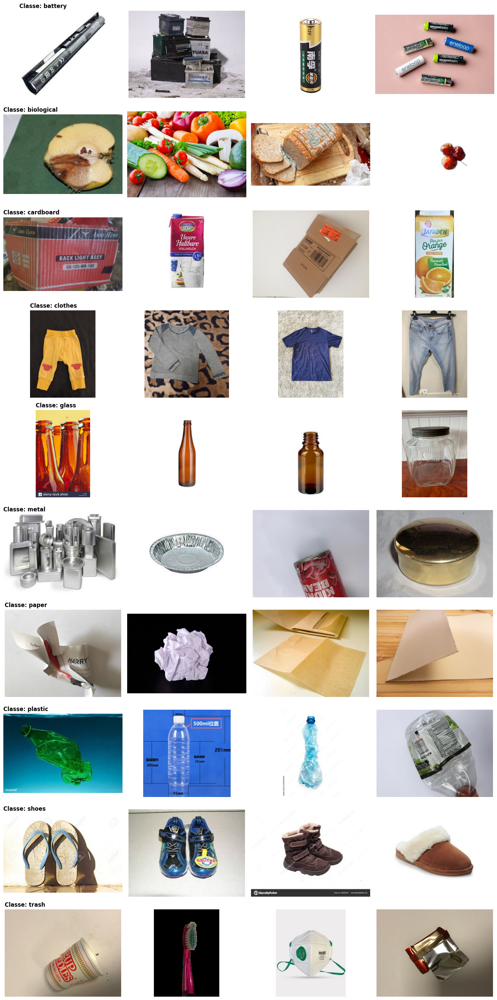

In [19]:
n_samples = 4
n_classes = NUM_CLASSES_GAR


fig, axes = plt.subplots(n_classes, n_samples, figsize=(15, 3 * n_classes))

for i, class_name in enumerate(full_ds_gar.classes):
    class_path = os.path.join(train_dir_gar, class_name)

    image_names = os.listdir(class_path)
    samples = random.sample(image_names, n_samples)
    
    for j, img_name in enumerate(samples):
        img_path = os.path.join(class_path, img_name)
        img = Image.open(img_path)
        
        # Gestion de l'affichage
        ax = axes[i, j]
        ax.imshow(img)
        ax.axis('off')
        if j == 0:
            ax.set_title(f"Classe: {class_name}", loc='left', fontweight='bold')

plt.tight_layout()
plt.show()

Contrairement au dataset précédent, les images dans les classes semblent assez différentes les unes des autre (c'est remarquable notamment dans la classe trash), ce qui pourra influencer l'entrainement des modèles, puisque les patterns de pixel seront différents seront les images. Ainsi, il est possible que le ViT performe mieux puisqu'il s'agit de la vision gloable qui risque d'avoir de l'importance.

Calcul des distributions pour 100 images par classe...


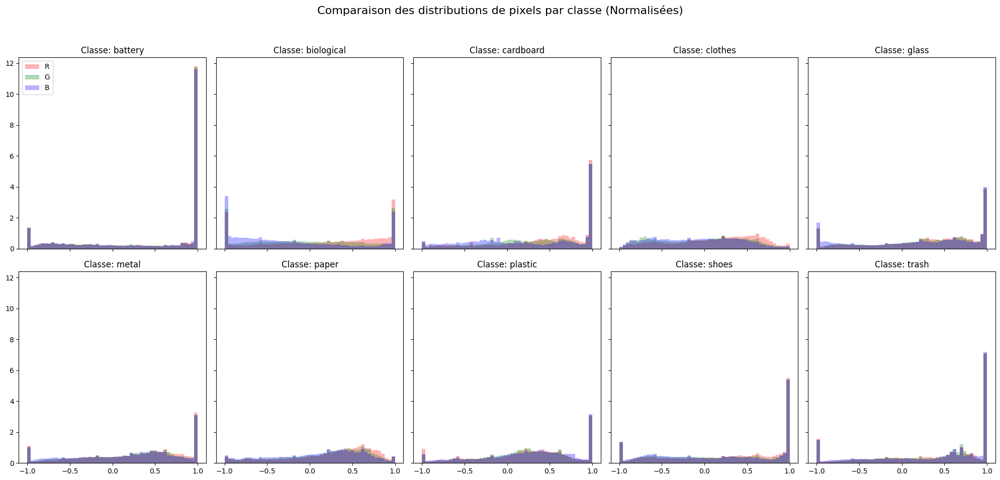

In [20]:
plot_pixel_distribution_per_class(full_ds_gar)

De manière similaire au dataset précédent, la distribution des pixels de couleurs ne semble pas être bien différente selon les classes, donc la couleur globale pourra ne pas avoir une grande influence dans la classification.

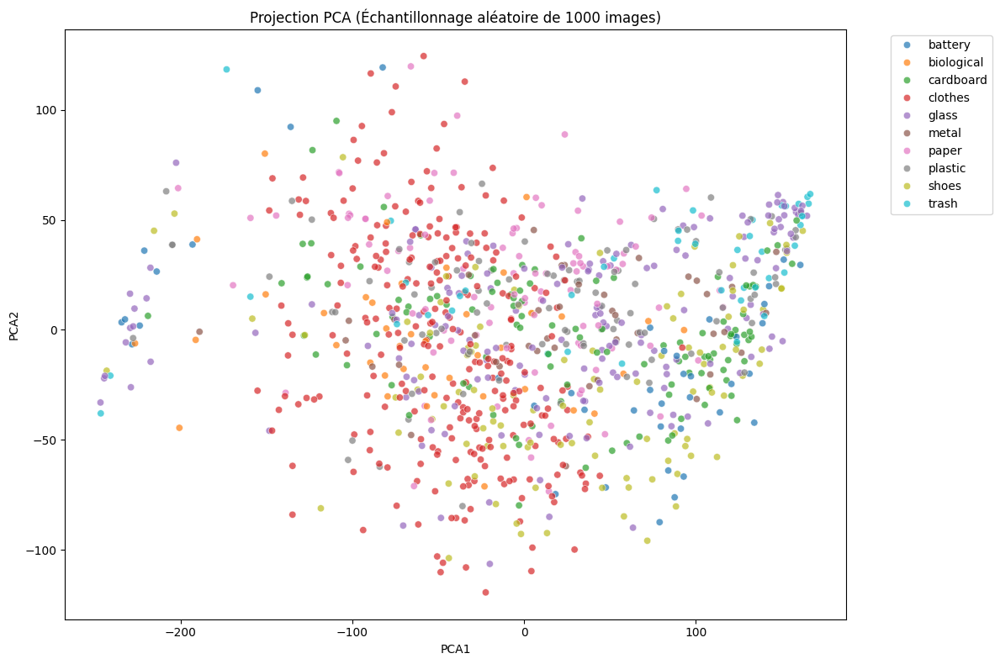

In [21]:
plot_pca_distribution_fixed(full_ds_gar)

La PCA appliquée aux pixels bruts montre un fort recouvrement entre classes, indiquant que les classes ne sont pas linéairement séparables dans l’espace des pixels et que des représentations apprises (CNN/ViT) sont nécessaires.

# Dataset CIFAR10

Le dernier dataset que nous avons utilisé est le dataset CIFAR-10. Il s'agit d'un dataset couramment utilisé dans les tâches de classification d'image. Ici, les images sont de tailles 32x32, elles sont donc beaucoup plus petites que les images des datasets précédents. Cela va donc également permettre de tester les modèles sur des images de taille plus petites. Egalement, il s'agit du plus grand modèle utilisé dans cette étude. Il ne s'agit pas d'un énorme dataset, mais étant malgré tout de grande taille, nous espérons que le ViT se démarque du CNN.

In [23]:
IMG_SIZE_CIF = 32
BATCH_SIZE = 32
SEED = 0
NUM_CLASSES_CIF=10
def pil_loader_rgb(path):
    with Image.open(path) as img:
        return img.convert("RGB")

TRAIN_DIR_CIF = "cifar10/cifar10/train"
TEST_DIR_CIF  = "cifar10/cifar10/test"

transform_cif = transforms.Compose([
    transforms.Resize((IMG_SIZE_CIF, IMG_SIZE_CIF)),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.5,0.5,0.5], std=[0.5,0.5,0.5]),
])

# Datasets
train_ds_cif = ImageFolder(root=TRAIN_DIR_CIF, transform=transform_cif, loader=pil_loader_rgb)
test_full_cif = ImageFolder(root=TEST_DIR_CIF,  transform=transform_cif, loader=pil_loader_rgb)


# Split du test : 80% val, 20% test final
torch.manual_seed(SEED)
n_test_cif = len(test_full_cif)
n_val_cif = int(0.8 * n_test_cif)
n_test_final_cif = n_test_cif - n_val_cif

val_ds_cif, test_ds_cif = random_split(test_full_cif, [n_val_cif, n_test_final_cif])

# DataLoaders
train_loader_cif = DataLoader(train_ds_cif, batch_size=BATCH_SIZE, shuffle=True,  num_workers=0, pin_memory=True)
val_loader_cif   = DataLoader(val_ds_cif,   batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)
test_loader_cif  = DataLoader(test_ds_cif,  batch_size=BATCH_SIZE, shuffle=False, num_workers=0, pin_memory=True)

x, y = next(iter(train_loader_cif))



In [24]:
class ConcatImageFolderWithMeta(ConcatDataset):
    
    def __init__(self, ds_list):
        super().__init__(ds_list)   
        self.classes = ds_list[0].classes
        self.targets = []
        for ds in ds_list:
            self.targets.extend(list(ds.targets))

full_ds_cif = ConcatImageFolderWithMeta([train_ds_cif, test_full_cif])

### Analyse exploratoire du dataset CIFAR10


In [25]:
print_dataset_report(
    name="CIFAR10",
    full_ds=full_ds_cif,
    train_ds=train_ds_cif,
    val_ds=val_ds_cif,
    test_ds=test_ds_cif,
    train_loader=train_loader_cif,
    val_loader=val_loader_cif,
    test_loader=test_loader_cif
)



DATASET REPORT — CIFAR10
Root dataset type: ConcatImageFolderWithMeta
Num classes: 10
Classes: ['airplane', 'automobile', 'bird', 'cat', 'deer', 'dog', 'frog', 'horse', 'ship', 'truck']
Total images: 60000
Split sizes: train=50000 | val=8000 | test=2000

Class distribution (counts):
  Train: airplane:5000, automobile:5000, bird:5000, cat:5000, deer:5000, dog:5000, frog:5000, horse:5000, ship:5000, truck:5000
  Val  : ship:815, truck:813, deer:810, cat:807, dog:804, frog:801, horse:794, airplane:791, bird:784, automobile:781
  Test : automobile:219, bird:216, airplane:209, horse:206, frog:199, dog:196, cat:193, deer:190, truck:187, ship:185

One train batch:
  images: shape=(32, 3, 32, 32) dtype=torch.float32 min=-1.000 max=1.000
  labels: shape=(32,) dtype=torch.int64 min=0 max=9
  expected label range: 0..9

Dataloaders:
  batch_size=32 | num_workers=0 | pin_memory=True
  train batches/epoch=1563 | val batches=250 | test batches=63


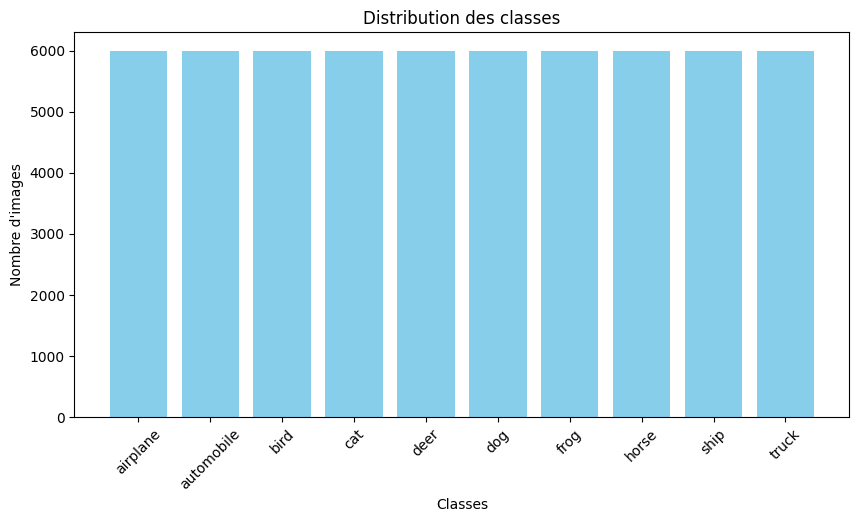

In [26]:
plot_class_distribution(full_ds_cif)

Comme vu dans la description du dataset, les classes sont parfaitement équilibrées, avec 6000 images par classe.

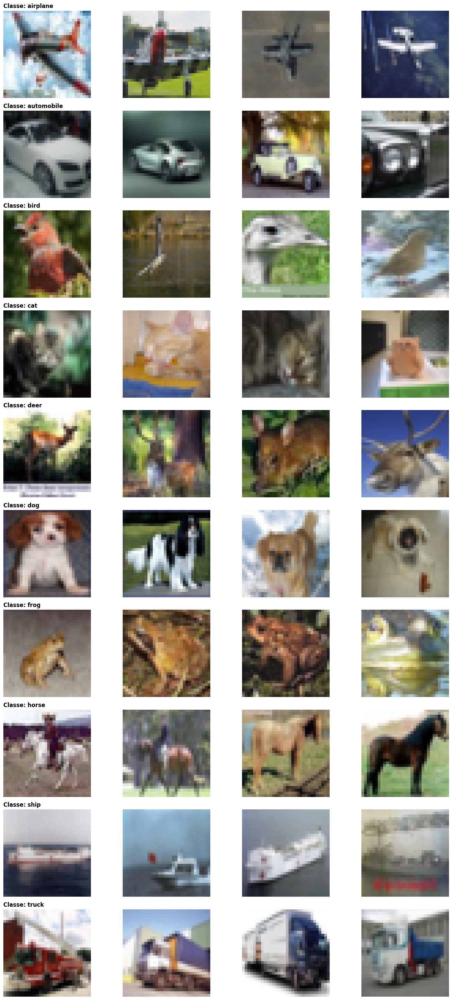

In [27]:
n_samples=4

n_samples = 4
fig, axes = plt.subplots(NUM_CLASSES_CIF, n_samples, figsize=(15, 3 * NUM_CLASSES_CIF))

for i, class_name in enumerate(full_ds_cif.classes):
    class_path = os.path.join(TRAIN_DIR_CIF, class_name)
    image_names = [f for f in os.listdir(class_path) if f.lower().endswith(('.png','.jpg','.jpeg','.bmp','.webp'))]

    samples = random.sample(image_names, min(n_samples, len(image_names)))

    for j in range(n_samples):
        ax = axes[i, j]
        ax.axis('off')

        if j < len(samples):
            img_path = os.path.join(class_path, samples[j])
            img = Image.open(img_path).convert("RGB")
            ax.imshow(img)

        if j == 0:
            ax.set_title(f"Classe: {class_name}", loc="left", fontweight="bold")

plt.tight_layout()
plt.show()

Comme dit précédemment concernant la taille des images, nous remarquons que celles-ci sont beaucoup plus floues que les images précédentes. Malgré cela, nous reconnaissons bien les différentes classes en fonction des individus.

Calcul des distributions pour 100 images par classe...


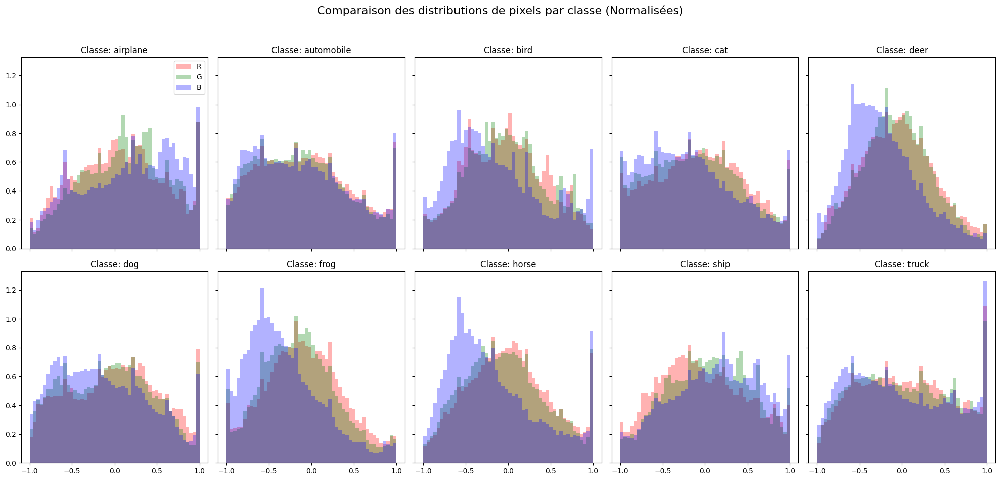

In [28]:
plot_pixel_distribution_per_class(full_ds_cif)

Ici, on remarque que les distributions des couleurs semblent différées entre les différents classes. En effet, on remarque que les classes airplane et ship ont une distribution des couleurs relativement similaires. Cela rejoint le fait que, comme dans le premier dataset, les images auront de grandes chances d'être avec des fonds bleu dus à la mer ou au ciel. De la même manière, certaines classes représentant des animaux, comme deer, frog ou horse, ont aussi des couleurs similaires. Ainsi, si les modèles se basent sur les couleurs, il est possible que ces classes soient proches. Idem pour automobile et truck.

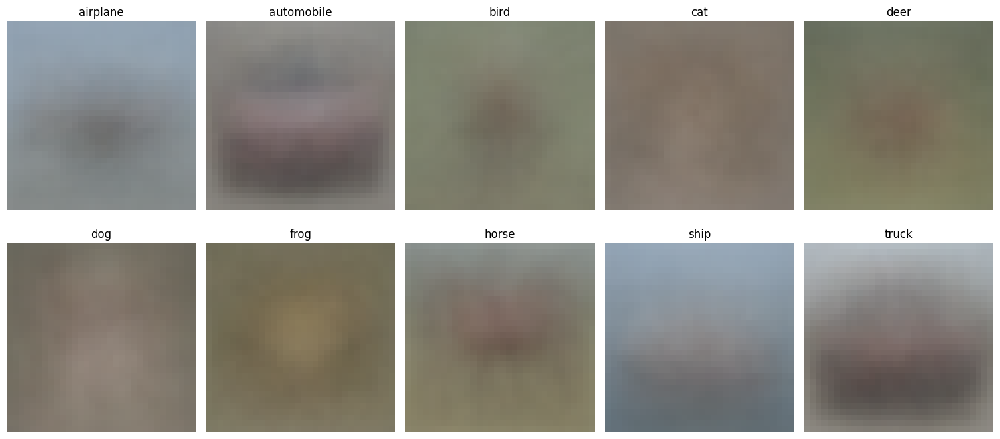

In [29]:
plot_mean_images(full_ds_cif)

Comme dit précédemment, certaines classes semblent avoir des fonds de couleurs proches, comme airplane et ship, ou les animaux comme bird, deer, frog et horse.

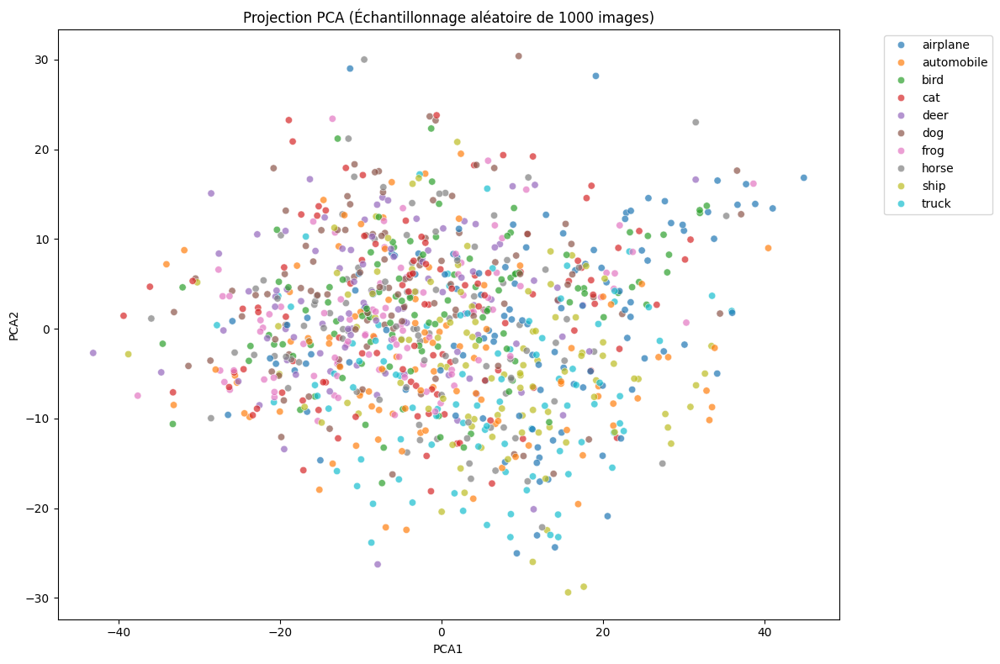

In [30]:
plot_pca_distribution_fixed(full_ds_cif)

Comme pour les autres datasets on ne voit pas de grande séparation ce qui indique que il n'y a pas de relation linéaire entre les classes.

#  Implémenation du ViT

L'implémentation du modèle ViT suit celle décrite dans la première partie.

In [32]:
class PatchEmbedding(nn.Module):
    def __init__(self, in_channels=3, patch_size=4, hidden_dim=128):
        super().__init__()
        self.patch_size = patch_size
        self.projection = nn.Conv2d(in_channels, hidden_dim, kernel_size=patch_size, stride=patch_size)
        
    def forward(self, x):
        x = self.projection(x) # (batch, hidden_dim, h_patch, w_patch)
        x = x.flatten(2) # (batch, hidden_dim, num_patches)
        x = x.transpose(1, 2) # (batch, num_patches, hidden_dim)
        return x

Découpage de l’image en patchs via une convolution stride = patch_size et projette chaque patch dans un espace de dimension hidden_dim.
On renvoie ensuite ces patchs sous forme de séquence de tokens de forme (batch, num_patches, hidden_dim).

In [33]:
class MultiHeadAttention(nn.Module):
    def __init__(self, hidden_dim, num_heads, dropout=0.0):
        super().__init__()
        self.mha = nn.MultiheadAttention(
            embed_dim=hidden_dim,
            num_heads=num_heads,
            dropout=dropout,
            batch_first=True,  
        )

    def forward(self, q, k, v, mask=None):

        out, _ = self.mha(q, k, v, need_weights=False)
        return out


Implémentation du mécanisme d'attention multi-head, en utilisant un module d'attention préexistant.

In [34]:
class LayerNorm(nn.Module):
    def __init__(self, hidden_dim):
        super().__init__()
        self.eps = 1e-5 # small value to avoid division by zero
        self.scale = nn.Parameter(torch.ones(hidden_dim)) # scale parameter (learnable)
        self.shift = nn.Parameter(torch.zeros(hidden_dim)) # shift parameter (learnable)

    def forward(self, x):
        mean = x.mean(dim=-1, keepdim=True)
        var = x.var(dim=-1, keepdim=True, unbiased=False)
        norm_x = (x - mean) / torch.sqrt(var + self.eps)
        y = self.scale * norm_x + self.shift
        return y

Pour chaque token, on normalise les activations sur la dimension hidden_dim. On applique ensuite une transformation affine apprenable (scale et shift) pour stabiliser l’entraînement et améliorer la convergence du Transformer.

In [35]:
class FeedForward(nn.Module):
    def __init__(self, hidden_dim):
        super().__init__()
        self.layers = nn.Sequential(
            nn.Linear(hidden_dim, hidden_dim * 4),
            nn.ReLU(),
            nn.Linear(hidden_dim * 4, hidden_dim)
        )

    def forward(self, x):
        return self.layers(x)

Implémentation du MLP: Deux couches linéaires avec une expansion ×4 de la dimension cachée, puis un retour à hidden_dim.
Il introduit de la non-linéarité (ReLU) et permet au modèle d’enrichir les représentations token par token après l’attention.

In [36]:
class TransformerEncoderBlock(nn.Module):
    def __init__(self, hidden_dim, num_heads, dropout=0.0, mlp_ratio=4):
        super().__init__()
        self.attention = MultiHeadAttention(hidden_dim, num_heads, dropout=dropout)
        self.norm1 = nn.LayerNorm(hidden_dim)
        self.norm2 = nn.LayerNorm(hidden_dim)

        mlp_hidden = int(hidden_dim * mlp_ratio)
        self.feed_forward = nn.Sequential(
            nn.Linear(hidden_dim, mlp_hidden),
            nn.GELU(),
            nn.Dropout(dropout),
            nn.Linear(mlp_hidden, hidden_dim),
            nn.Dropout(dropout),
        )

    def forward(self, x):
        y = self.norm1(x)
        x = x + self.attention(y, y, y, mask=None)
        x = x + self.feed_forward(self.norm2(x))
        return x


On définit ici le block encoder de notre transformer: normalisation puis self-attention multi-têtes, avec connexion résiduelle pour stabiliser l’apprentissage.
On ajoute ensuite un MLP (GELU + dropout) également entouré d’une connexion résiduelle, afin d’enrichir les représentations token par token.

In [37]:
class VisionTransformer(nn.Module):
    def __init__(self, patch_size, hidden_dim, num_heads, num_layers, num_classes,
                 img_size=32, dropout=0.2, mlp_ratio=4):
        super().__init__()
        
        assert img_size % patch_size == 0

        self.patch_embedding = PatchEmbedding(patch_size=patch_size, hidden_dim=hidden_dim)
        self.cls_token = nn.Parameter(torch.zeros(1, 1, hidden_dim))
        num_patches = (img_size // patch_size) ** 2
        self.pos_embedding = nn.Parameter(torch.zeros(1, num_patches + 1, hidden_dim))
        self.pos_dropout = nn.Dropout(dropout)

        self.transformer = nn.Sequential(*[
            TransformerEncoderBlock(hidden_dim, num_heads, dropout=dropout, mlp_ratio=mlp_ratio)
            for _ in range(num_layers)
        ])
        nn.init.trunc_normal_(self.pos_embedding, std=0.02)
        nn.init.trunc_normal_(self.cls_token, std=0.02)

        self.classifier = nn.Sequential(
        nn.LayerNorm(hidden_dim),
        nn.Linear(hidden_dim, num_classes))

    def forward(self, x):
        x = self.patch_embedding(x)
        B = x.shape[0]
        cls_tokens = self.cls_token.expand(B, -1, -1)
        x = torch.cat((cls_tokens, x), dim=1)
        x = self.pos_dropout(x + self.pos_embedding)
        x = self.transformer(x)
        return self.classifier(x[:, 0])


Mise en place de la classe VisionTransformer. Assemblage de toutes les étapes décrites precedemment

# Implémentation du CNN

In [38]:
class VGG16CNN(nn.Module):
    """
    VGG16-style CNN codé à la main.
    Pour IMG_SIZE=128, après 5 MaxPool2d(2): 128 -> 64 -> 32 -> 16 -> 8 -> 4
    Donc la carte finale est (512, 4, 4).
    """
    def __init__(self, num_classes, img_size=32, dropout=0.25):
        super().__init__()

        self.features = nn.Sequential(
            # Block 1: 128 -> 64
            nn.Conv2d(3, 64, kernel_size=3, padding=1), nn.ReLU(inplace=True),
            nn.Conv2d(64, 64, kernel_size=3, padding=1), nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Block 2: 64 -> 32
            nn.Conv2d(64, 128, kernel_size=3, padding=1), nn.ReLU(inplace=True),
            nn.Conv2d(128, 128, kernel_size=3, padding=1), nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Block 3: 32 -> 16
            nn.Conv2d(128, 256, kernel_size=3, padding=1), nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1), nn.ReLU(inplace=True),
            nn.Conv2d(256, 256, kernel_size=3, padding=1), nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Block 4: 16 -> 8
            nn.Conv2d(256, 512, kernel_size=3, padding=1), nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1), nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1), nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),

            # Block 5: 8 -> 4
            nn.Conv2d(512, 512, kernel_size=3, padding=1), nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1), nn.ReLU(inplace=True),
            nn.Conv2d(512, 512, kernel_size=3, padding=1), nn.ReLU(inplace=True),
            nn.MaxPool2d(kernel_size=2, stride=2),
        )

        # taille finale spatiale après 5 pools
        feat_size = img_size // (2**5)  # 128//32 = 4
        feat_dim = 512 * feat_size * feat_size

        self.classifier = nn.Sequential(
            nn.Flatten(),
            nn.Linear(feat_dim, 4096), nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(4096, 4096), nn.ReLU(inplace=True),
            nn.Dropout(dropout),
            nn.Linear(4096, num_classes)
        )

    def forward(self, x):
        x = self.features(x)
        x = self.classifier(x)
        return x

Ce CNN est une implémentation d’un VGG16-style : 13 couches de convolution 3×3 regroupées en 5 blocs avec MaxPooling, suivies d’un classifieur 4096–4096 avec Dropout, adapté à un nombre de classes variable.

In [39]:
def print_params_report(name, model):
    total = sum(p.numel() for p in model.parameters())
    trainable = sum(p.numel() for p in model.parameters() if p.requires_grad)
    pct = 100.0 * trainable / total if total > 0 else 0.0
    print(f"{name}: trainable={trainable:,} | total={total:,} | trainable%={pct:.1f}%")

## Fonctions d'entraînement

In [40]:
def train_epoch(model, dataloader, optimizer, criterion, device, desc="train"):
    model.train()
    total_loss, total_acc = 0.0, 0.0

    pbar = tqdm(dataloader, desc=desc, leave=False)
    for images, labels in pbar:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True).long() 

        optimizer.zero_grad(set_to_none=True)
        outputs = model(images)

        if outputs.ndim != 2:
            raise ValueError(f"outputs should be (B, C), got {outputs.shape}")
        C = outputs.size(1)
        if labels.min().item() < 0 or labels.max().item() >= C:
            raise ValueError(
                f"Label out of range for CrossEntropy: "
                f"min={labels.min().item()}, max={labels.max().item()}, C={C}"
            )

        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        batch_acc = (outputs.argmax(1) == labels).float().mean().item()
        total_loss += loss.item()
        total_acc  += batch_acc
        pbar.set_postfix(loss=f"{loss.item():.4f}", acc=f"{batch_acc:.3f}")

    n = len(dataloader)
    return total_loss / n, total_acc / n


In [41]:
@torch.no_grad()
def evaluate(model, dataloader, criterion, device, desc="val"):
    model.eval()
    total_loss, total_acc = 0.0, 0.0

    pbar = tqdm(dataloader, desc=desc, leave=False)
    for images, labels in pbar:
        images = images.to(device, non_blocking=True)
        labels = labels.to(device, non_blocking=True).long()

        outputs = model(images)
        loss = criterion(outputs, labels)

        batch_acc = (outputs.argmax(1) == labels).float().mean().item()
        total_loss += loss.item()
        total_acc  += batch_acc

        pbar.set_postfix(loss=f"{loss.item():.4f}", acc=f"{batch_acc:.3f}")

    n = len(dataloader)
    return total_loss / n, total_acc / n

In [42]:
def plot_vit_vs_cnn(results, title=""):
    epochs = range(1, len(results["vit"]["train_loss"]) + 1)

    # --- Loss ---
    plt.figure()
    plt.plot(epochs, results["vit"]["train_loss"], label="ViT train loss")
    plt.plot(epochs, results["vit"]["val_loss"],   label="ViT val loss")
    plt.plot(epochs, results["cnn"]["train_loss"], label="CNN train loss")
    plt.plot(epochs, results["cnn"]["val_loss"],   label="CNN val loss")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.title(f"Loss — {title}" if title else "Loss")
    plt.legend()
    plt.grid(True)
    plt.show()

    # --- Accuracy ---
    plt.figure()
    plt.plot(epochs, results["vit"]["train_acc"], label="ViT train acc")
    plt.plot(epochs, results["vit"]["val_acc"],   label="ViT val acc")
    plt.plot(epochs, results["cnn"]["train_acc"], label="CNN train acc")
    plt.plot(epochs, results["cnn"]["val_acc"],   label="CNN val acc")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.title(f"Accuracy — {title}" if title else "Accuracy")
    plt.legend()
    plt.grid(True)
    plt.show()

# Entraînement du dataset Vehicules

In [53]:
# Paramètres
HIDDEN_DIM = 256
NUM_HEADS = 8
PATCH_SIZE = 16 #

# Initialisation
vit_model_v = VisionTransformer(
    patch_size=PATCH_SIZE, 
    hidden_dim=HIDDEN_DIM, 
    num_heads=NUM_HEADS, 
    num_layers=6, 
    num_classes=NUM_CLASSES_V, 
    img_size=IMG_SIZE_V,
    dropout=0.2
).to(device)

cnn_model_v = VGG16CNN(num_classes=NUM_CLASSES_V,img_size=IMG_SIZE_V).to(device)

optimizer_vit_v = torch.optim.AdamW(vit_model_v.parameters(), lr=1e-4,weight_decay=0.05)
optimizer_cnn_v = torch.optim.AdamW(cnn_model_v.parameters(), lr=3e-5, weight_decay=1e-2)
criterion = nn.CrossEntropyLoss()

print("Modèles prêts pour l'entraînement !")

Modèles prêts pour l'entraînement !


In [50]:
summary(cnn_model_v, input_size=(1, 3, 128, 128))

Layer (type:depth-idx)                   Output Shape              Param #
VGG16CNN                                 [1, 7]                    --
├─Sequential: 1-1                        [1, 512, 4, 4]            --
│    └─Conv2d: 2-1                       [1, 64, 128, 128]         1,792
│    └─ReLU: 2-2                         [1, 64, 128, 128]         --
│    └─Conv2d: 2-3                       [1, 64, 128, 128]         36,928
│    └─ReLU: 2-4                         [1, 64, 128, 128]         --
│    └─MaxPool2d: 2-5                    [1, 64, 64, 64]           --
│    └─Conv2d: 2-6                       [1, 128, 64, 64]          73,856
│    └─ReLU: 2-7                         [1, 128, 64, 64]          --
│    └─Conv2d: 2-8                       [1, 128, 64, 64]          147,584
│    └─ReLU: 2-9                         [1, 128, 64, 64]          --
│    └─MaxPool2d: 2-10                   [1, 128, 32, 32]          --
│    └─Conv2d: 2-11                      [1, 256, 32, 32]          29

In [51]:
summary(vit_model_v, input_size=(1, 3, 128, 128))


Layer (type:depth-idx)                        Output Shape              Param #
VisionTransformer                             [1, 7]                    16,896
├─PatchEmbedding: 1-1                         [1, 64, 256]              --
│    └─Conv2d: 2-1                            [1, 256, 8, 8]            196,864
├─Dropout: 1-2                                [1, 65, 256]              --
├─Sequential: 1-3                             [1, 65, 256]              --
│    └─TransformerEncoderBlock: 2-2           [1, 65, 256]              --
│    │    └─LayerNorm: 3-1                    [1, 65, 256]              512
│    │    └─MultiHeadAttention: 3-2           [1, 65, 256]              263,168
│    │    └─LayerNorm: 3-3                    [1, 65, 256]              512
│    │    └─Sequential: 3-4                   [1, 65, 256]              525,568
│    └─TransformerEncoderBlock: 2-3           [1, 65, 256]              --
│    │    └─LayerNorm: 3-5                    [1, 65, 256]              51

In [54]:
EPOCHS = 20
results_v = {
    "vit": {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []},
    "cnn": {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []},
}

for epoch in range(EPOCHS):
    # ---- ViT ----
    vit_train_loss, vit_train_acc = train_epoch(vit_model_v, train_loader_v, optimizer_vit_v, criterion, device,
                                                desc=f"ViT train {epoch+1}/{EPOCHS}")
    vit_val_loss,   vit_val_acc   = evaluate(vit_model_v, val_loader_v, criterion, device,desc=f"ViT val {epoch+1}/{EPOCHS}")

    results_v["vit"]["train_loss"].append(vit_train_loss)
    results_v["vit"]["train_acc"].append(vit_train_acc)
    results_v["vit"]["val_loss"].append(vit_val_loss)
    results_v["vit"]["val_acc"].append(vit_val_acc)

    # ---- CNN ----
    cnn_train_loss, cnn_train_acc = train_epoch(cnn_model_v, train_loader_v, optimizer_cnn_v, criterion, device,desc=f"CNN train {epoch+1}/{EPOCHS}")
    cnn_val_loss,   cnn_val_acc   = evaluate(cnn_model_v, val_loader_v, criterion, device,desc=f"CNN val {epoch+1}/{EPOCHS}")

    results_v["cnn"]["train_loss"].append(cnn_train_loss)
    results_v["cnn"]["train_acc"].append(cnn_train_acc)
    results_v["cnn"]["val_loss"].append(cnn_val_loss)
    results_v["cnn"]["val_acc"].append(cnn_val_acc)

    print(
        f"Epoch {epoch+1}/{EPOCHS} | "
        f"ViT: train acc {vit_train_acc:.2f} val acc {vit_val_acc:.2f} || "
        f"CNN: train acc {cnn_train_acc:.2f} val acc {cnn_val_acc:.2f}"
    )


ViT train 1/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 1/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 1/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 1/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 1/20 | ViT: train acc 0.39 val acc 0.43 || CNN: train acc 0.13 val acc 0.15


ViT train 2/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 2/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 2/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 2/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 2/20 | ViT: train acc 0.48 val acc 0.53 || CNN: train acc 0.29 val acc 0.33


ViT train 3/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 3/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 3/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 3/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 3/20 | ViT: train acc 0.55 val acc 0.54 || CNN: train acc 0.37 val acc 0.42


ViT train 4/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 4/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 4/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 4/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 4/20 | ViT: train acc 0.59 val acc 0.61 || CNN: train acc 0.52 val acc 0.58


ViT train 5/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 5/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 5/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 5/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 5/20 | ViT: train acc 0.63 val acc 0.66 || CNN: train acc 0.63 val acc 0.64


ViT train 6/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 6/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 6/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 6/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 6/20 | ViT: train acc 0.65 val acc 0.63 || CNN: train acc 0.69 val acc 0.70


ViT train 7/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 7/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 7/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 7/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 7/20 | ViT: train acc 0.68 val acc 0.65 || CNN: train acc 0.73 val acc 0.71


ViT train 8/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 8/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 8/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 8/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 8/20 | ViT: train acc 0.70 val acc 0.66 || CNN: train acc 0.77 val acc 0.72


ViT train 9/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 9/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 9/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 9/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 9/20 | ViT: train acc 0.70 val acc 0.65 || CNN: train acc 0.81 val acc 0.73


ViT train 10/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 10/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 10/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 10/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 10/20 | ViT: train acc 0.72 val acc 0.68 || CNN: train acc 0.85 val acc 0.74


ViT train 11/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 11/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 11/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 11/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 11/20 | ViT: train acc 0.75 val acc 0.66 || CNN: train acc 0.88 val acc 0.74


ViT train 12/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 12/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 12/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 12/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 12/20 | ViT: train acc 0.76 val acc 0.67 || CNN: train acc 0.93 val acc 0.76


ViT train 13/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 13/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 13/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 13/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 13/20 | ViT: train acc 0.78 val acc 0.71 || CNN: train acc 0.95 val acc 0.70


ViT train 14/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 14/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 14/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 14/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 14/20 | ViT: train acc 0.79 val acc 0.66 || CNN: train acc 0.97 val acc 0.75


ViT train 15/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 15/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 15/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 15/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 15/20 | ViT: train acc 0.81 val acc 0.64 || CNN: train acc 0.97 val acc 0.76


ViT train 16/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 16/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 16/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 16/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 16/20 | ViT: train acc 0.81 val acc 0.70 || CNN: train acc 0.98 val acc 0.71


ViT train 17/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 17/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 17/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 17/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 17/20 | ViT: train acc 0.84 val acc 0.67 || CNN: train acc 0.97 val acc 0.75


ViT train 18/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 18/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 18/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 18/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 18/20 | ViT: train acc 0.84 val acc 0.70 || CNN: train acc 0.98 val acc 0.77


ViT train 19/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 19/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 19/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 19/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 19/20 | ViT: train acc 0.85 val acc 0.70 || CNN: train acc 0.99 val acc 0.74


ViT train 20/20:   0%|          | 0/140 [00:00<?, ?it/s]

ViT val 20/20:   0%|          | 0/18 [00:00<?, ?it/s]

CNN train 20/20:   0%|          | 0/140 [00:00<?, ?it/s]

CNN val 20/20:   0%|          | 0/18 [00:00<?, ?it/s]

Epoch 20/20 | ViT: train acc 0.87 val acc 0.71 || CNN: train acc 0.99 val acc 0.73


In [57]:
torch.save(vit_model_v.state_dict(), "Final_30_epochs_vit_vehicules.pth")
torch.save(cnn_model_v.state_dict(), "Final_30_epochs_cnn_vehicules.pth")

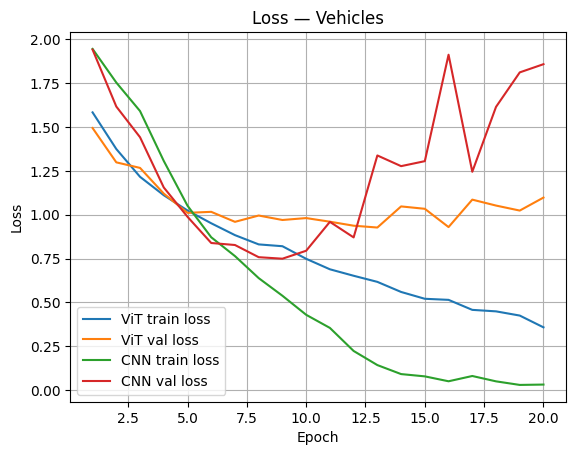

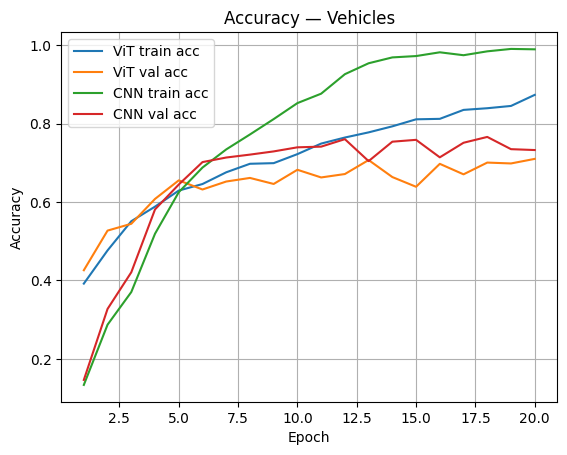

In [55]:
plot_vit_vs_cnn(results_v, title="Vehicles")

Nous observons avec les courbes de la loss que le CNN s'adpter plus vite aux données des véhicules pour atteindre une loss de 0.75 vers l'epoch 9. Pour Le ViT, la loss semble converger beaucoup plus rapidement, mais redescend doucement au minimum à une loss d'environ 0.9 à l'epoch 13. Pour les deux cas, le modèle semble overfitter sur les données d'entraînement à partir d'environ 10 epochs.

Au niveau de l'accuracy, celle du CNN semble augmenter plus rapidement pour atteindre son maximum à 13 epochs, et celle du ViT augmente plus lentement jusqu'à l'epoch 13 également à 0.7. Cette stagnation est également due à l'overfitting sur les données.

Cette stagnation rapide des deux architectures pourrait être due au fait que les modèles sont très profonds et complexes. Aussi, l'overfitting très rapide du CNN peut s'expliquer car sur ce jeu de données, les véhicules se distinguent bien entre les classes, mais sont très similaires entre eux dans les classes. Ainsi, le CNN aura la possibilité de comprendre plus vite les relations entre les pixels. Le ViT, au contraire, capte les relations plus générales, ce qu'il fait beaucoup plus lentement et avec plus de données.

# Entraînement du dataset Garbage

In [58]:
# Paramètres
HIDDEN_DIM = 256
NUM_HEADS = 8
PATCH_SIZE = 16 

# Initialisation
vit_model_gar = VisionTransformer(
    patch_size=PATCH_SIZE, 
    hidden_dim=HIDDEN_DIM, 
    num_heads=NUM_HEADS, 
    num_layers=6, 
    num_classes=NUM_CLASSES_GAR, 
    img_size=IMG_SIZE_GAR,
    dropout=0.2
).to(device)

cnn_model_gar = VGG16CNN(num_classes=NUM_CLASSES_GAR,img_size=IMG_SIZE_GAR).to(device)


optimizer_vit_gar = torch.optim.AdamW(vit_model_gar.parameters(), lr=3e-4,weight_decay=0.05)
optimizer_cnn_gar = torch.optim.AdamW(cnn_model_gar.parameters(), lr=3e-5, weight_decay=1e-2)
criterion = nn.CrossEntropyLoss()

print("Modèles prêts pour l'entraînement !")
print_params_report("CNN (VGG16-style)", cnn_model_gar)
print_params_report("ViT", vit_model_gar)

Modèles prêts pour l'entraînement !
CNN (VGG16-style): trainable=65,095,498 | total=65,095,498 | trainable%=100.0%
ViT: trainable=4,955,402 | total=4,955,402 | trainable%=100.0%


In [60]:
EPOCHS = 20
results_gar = {
    "vit": {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []},
    "cnn": {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []},
}

for epoch in range(EPOCHS):
    # ---- ViT ----
    vit_train_loss, vit_train_acc = train_epoch(vit_model_gar, train_loader_gar, optimizer_vit_gar, criterion, device,desc=f"ViT train {epoch+1}/{EPOCHS}")
    vit_val_loss,   vit_val_acc   = evaluate(vit_model_gar, val_loader_gar, criterion, device,desc=f"ViT val {epoch+1}/{EPOCHS}")

    results_gar["vit"]["train_loss"].append(vit_train_loss)
    results_gar["vit"]["train_acc"].append(vit_train_acc)
    results_gar["vit"]["val_loss"].append(vit_val_loss)
    results_gar["vit"]["val_acc"].append(vit_val_acc)

    # ---- CNN ----
    cnn_train_loss, cnn_train_acc = train_epoch(cnn_model_gar, train_loader_gar, optimizer_cnn_gar, criterion, device,desc=f"CNN train {epoch+1}/{EPOCHS}")
    cnn_val_loss,   cnn_val_acc   = evaluate(cnn_model_gar, val_loader_gar, criterion, device,desc=f"CNN val {epoch+1}/{EPOCHS}")

    results_gar["cnn"]["train_loss"].append(cnn_train_loss)
    results_gar["cnn"]["train_acc"].append(cnn_train_acc)
    results_gar["cnn"]["val_loss"].append(cnn_val_loss)
    results_gar["cnn"]["val_acc"].append(cnn_val_acc)

    print(
        f"Epoch {epoch+1}/{EPOCHS} | "
        f"ViT: train acc {vit_train_acc:.2f} val acc {vit_val_acc:.2f} || "
        f"CNN: train acc {cnn_train_acc:.2f} val acc {cnn_val_acc:.2f}"
    )


ViT train 1/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 1/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 1/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 1/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 1/20 | ViT: train acc 0.42 val acc 0.45 || CNN: train acc 0.32 val acc 0.37


ViT train 2/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 2/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 2/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 2/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 2/20 | ViT: train acc 0.49 val acc 0.50 || CNN: train acc 0.42 val acc 0.45


ViT train 3/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 3/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 3/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 3/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 3/20 | ViT: train acc 0.52 val acc 0.53 || CNN: train acc 0.50 val acc 0.51


ViT train 4/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 4/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 4/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 4/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 4/20 | ViT: train acc 0.55 val acc 0.51 || CNN: train acc 0.56 val acc 0.55


ViT train 5/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 5/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 5/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 5/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 5/20 | ViT: train acc 0.57 val acc 0.55 || CNN: train acc 0.63 val acc 0.61


ViT train 6/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 6/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 6/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 6/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 6/20 | ViT: train acc 0.59 val acc 0.56 || CNN: train acc 0.68 val acc 0.65


ViT train 7/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 7/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 7/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 7/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 7/20 | ViT: train acc 0.61 val acc 0.59 || CNN: train acc 0.72 val acc 0.68


ViT train 8/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 8/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 8/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 8/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 8/20 | ViT: train acc 0.62 val acc 0.60 || CNN: train acc 0.77 val acc 0.68


ViT train 9/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 9/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 9/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 9/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 9/20 | ViT: train acc 0.64 val acc 0.61 || CNN: train acc 0.83 val acc 0.72


ViT train 10/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 10/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 10/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 10/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 10/20 | ViT: train acc 0.65 val acc 0.62 || CNN: train acc 0.88 val acc 0.70


ViT train 11/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 11/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 11/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 11/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 11/20 | ViT: train acc 0.67 val acc 0.60 || CNN: train acc 0.91 val acc 0.70


ViT train 12/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 12/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 12/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 12/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 12/20 | ViT: train acc 0.68 val acc 0.59 || CNN: train acc 0.93 val acc 0.71


ViT train 13/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 13/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 13/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 13/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 13/20 | ViT: train acc 0.70 val acc 0.62 || CNN: train acc 0.94 val acc 0.70


ViT train 14/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 14/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 14/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 14/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 14/20 | ViT: train acc 0.72 val acc 0.63 || CNN: train acc 0.96 val acc 0.70


ViT train 15/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 15/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 15/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 15/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 15/20 | ViT: train acc 0.72 val acc 0.66 || CNN: train acc 0.96 val acc 0.71


ViT train 16/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 16/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 16/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 16/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 16/20 | ViT: train acc 0.74 val acc 0.64 || CNN: train acc 0.97 val acc 0.71


ViT train 17/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 17/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 17/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 17/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 17/20 | ViT: train acc 0.76 val acc 0.67 || CNN: train acc 0.97 val acc 0.72


ViT train 18/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 18/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 18/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 18/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 18/20 | ViT: train acc 0.77 val acc 0.65 || CNN: train acc 0.97 val acc 0.70


ViT train 19/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 19/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 19/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 19/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 19/20 | ViT: train acc 0.78 val acc 0.67 || CNN: train acc 0.97 val acc 0.71


ViT train 20/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val 20/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 20/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val 20/20:   0%|          | 0/64 [00:00<?, ?it/s]

Epoch 20/20 | ViT: train acc 0.80 val acc 0.66 || CNN: train acc 0.98 val acc 0.72


In [66]:
torch.save(vit_model_gar.state_dict(), "Final_20_epochs_vit_gar.pth")
torch.save(cnn_model_gar.state_dict(), "Final_20_epochs_cnn_gar.pth")

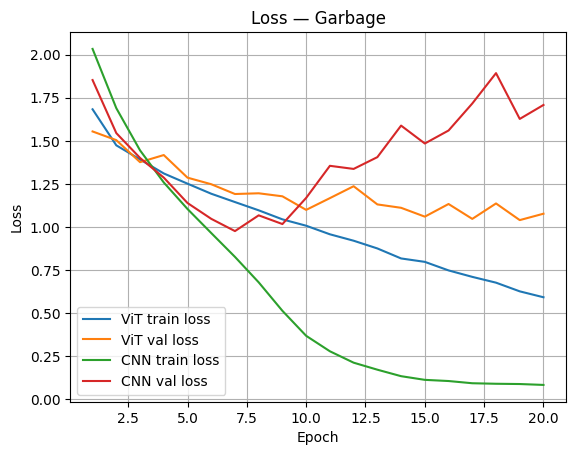

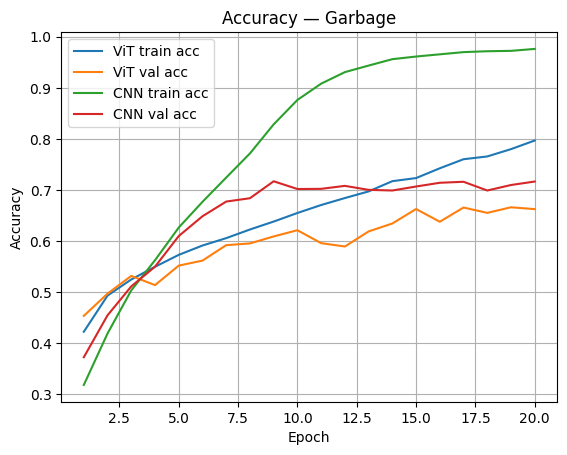

In [63]:
plot_vit_vs_cnn(results_gar, title="Garbage")

Pour ce dataset, on remarque un comportement similaire au dataset précédent. Au bout d'environ 10 epochs, l'accuracy des modèles est au plus haut et la loss est au plus bas. Ensuite, le modèle semble overfitter à nouveau sur les données. Cet over fitting se remarque beaucoup plus avec le CNN, qui apprend très vite sur le dataset, tandis que le ViT semble apprendre de manière linéaire. Néanmoins, le CNN ne monte pas aussi haut que le dataset précédent, car les éléments dans les classes ne sont pas forcément proches entre eux (trash possède à la fois des masques et des canettes).

# Entraînement du dataset CIFAR10

In [64]:
# Initialisation
HIDDEN_DIM = 256
NUM_HEADS = 8
PATCH_SIZE_CIF=4

vit_model_cif = VisionTransformer(
    patch_size=PATCH_SIZE_CIF, 
    hidden_dim=HIDDEN_DIM, 
    num_heads=NUM_HEADS, 
    num_layers=6, 
    num_classes=NUM_CLASSES_CIF, 
    img_size=IMG_SIZE_CIF,
    dropout=0.2
).to(device)

cnn_model_cif = VGG16CNN(num_classes=NUM_CLASSES_CIF).to(device)


optimizer_vit_cif = torch.optim.AdamW(vit_model_cif.parameters(), lr=3e-4,weight_decay=0.05)
optimizer_cnn_cif = torch.optim.AdamW(cnn_model_cif.parameters(), lr=3e-5, weight_decay=1e-2)
criterion = nn.CrossEntropyLoss()
print_params_report("CNN (VGG16-style)", cnn_model_cif)
print_params_report("ViT", vit_model_cif)

print("Modèles prêts pour l'entraînement !")

CNN (VGG16-style): trainable=33,638,218 | total=33,638,218 | trainable%=100.0%
ViT: trainable=4,771,082 | total=4,771,082 | trainable%=100.0%
Modèles prêts pour l'entraînement !


On observe qu'il y a moins de paramètres sur ces modèles car les images sont plus petites.

In [65]:

EPOCHS = 20
results_cif = {
    "vit": {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []},
    "cnn": {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []},
}

for epoch in range(EPOCHS):
    # ---- ViT ----
    vit_train_loss, vit_train_acc = train_epoch(
        vit_model_cif, train_loader_cif, optimizer_vit_cif, criterion, device,
        desc=f"ViT train {epoch+1}/{EPOCHS}"
    )
    vit_val_loss, vit_val_acc = evaluate(
        vit_model_cif, val_loader_cif, criterion, device,
        desc=f"ViT val   {epoch+1}/{EPOCHS}"
    )

    results_cif["vit"]["train_loss"].append(vit_train_loss)
    results_cif["vit"]["train_acc"].append(vit_train_acc)
    results_cif["vit"]["val_loss"].append(vit_val_loss)
    results_cif["vit"]["val_acc"].append(vit_val_acc)

    # ---- CNN ----
    cnn_train_loss, cnn_train_acc = train_epoch(
        cnn_model_cif, train_loader_cif, optimizer_cnn_cif, criterion, device,
        desc=f"CNN train {epoch+1}/{EPOCHS}"
    )
    cnn_val_loss, cnn_val_acc = evaluate(
        cnn_model_cif, val_loader_cif, criterion, device,
        desc=f"CNN val   {epoch+1}/{EPOCHS}"
    )

    results_cif["cnn"]["train_loss"].append(cnn_train_loss)
    results_cif["cnn"]["train_acc"].append(cnn_train_acc)
    results_cif["cnn"]["val_loss"].append(cnn_val_loss)
    
    # ---- Affichage fin d'epoch ----
    tqdm.write(
        f"Epoch {epoch+1}/{EPOCHS}\n"
        f"  ViT | train: loss {vit_train_loss:.4f} acc {vit_train_acc:.3f}  "
        f"| val: loss {vit_val_loss:.4f} acc {vit_val_acc:.3f}\n"
        f"  CNN | train: loss {cnn_train_loss:.4f} acc {cnn_train_acc:.3f}  "
        f"| val: loss {cnn_val_loss:.4f} acc {cnn_val_acc:.3f}\n"
    )



ViT train 1/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   1/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 1/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   1/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 1/20
  ViT | train: loss 1.6646 acc 0.379  | val: loss 1.4148 acc 0.488
  CNN | train: loss 1.9481 acc 0.227  | val: loss 1.7703 acc 0.291



ViT train 2/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   2/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 2/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   2/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 2/20
  ViT | train: loss 1.3467 acc 0.507  | val: loss 1.3111 acc 0.530
  CNN | train: loss 1.5923 acc 0.383  | val: loss 1.3868 acc 0.482



ViT train 3/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   3/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 3/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   3/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 3/20
  ViT | train: loss 1.2392 acc 0.549  | val: loss 1.2665 acc 0.537
  CNN | train: loss 1.2580 acc 0.542  | val: loss 1.1782 acc 0.569



ViT train 4/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   4/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 4/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   4/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 4/20
  ViT | train: loss 1.1679 acc 0.576  | val: loss 1.1897 acc 0.568
  CNN | train: loss 1.0306 acc 0.632  | val: loss 1.0030 acc 0.650



ViT train 5/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   5/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 5/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   5/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 5/20
  ViT | train: loss 1.1170 acc 0.595  | val: loss 1.1030 acc 0.603
  CNN | train: loss 0.8704 acc 0.695  | val: loss 0.8852 acc 0.693



ViT train 6/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   6/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 6/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   6/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 6/20
  ViT | train: loss 1.0796 acc 0.609  | val: loss 1.0873 acc 0.609
  CNN | train: loss 0.7474 acc 0.739  | val: loss 0.8413 acc 0.723



ViT train 7/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   7/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 7/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   7/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 7/20
  ViT | train: loss 1.0437 acc 0.620  | val: loss 1.0569 acc 0.620
  CNN | train: loss 0.6460 acc 0.778  | val: loss 0.7904 acc 0.747



ViT train 8/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   8/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 8/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   8/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 8/20
  ViT | train: loss 1.0111 acc 0.634  | val: loss 1.0322 acc 0.632
  CNN | train: loss 0.5649 acc 0.809  | val: loss 0.7287 acc 0.760



ViT train 9/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   9/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 9/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   9/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 9/20
  ViT | train: loss 0.9817 acc 0.646  | val: loss 1.0327 acc 0.634
  CNN | train: loss 0.4913 acc 0.835  | val: loss 0.7591 acc 0.762



ViT train 10/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   10/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 10/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   10/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 10/20
  ViT | train: loss 0.9518 acc 0.658  | val: loss 1.0389 acc 0.632
  CNN | train: loss 0.4183 acc 0.860  | val: loss 0.8053 acc 0.761



ViT train 11/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   11/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 11/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   11/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 11/20
  ViT | train: loss 0.9299 acc 0.665  | val: loss 1.0024 acc 0.640
  CNN | train: loss 0.3727 acc 0.876  | val: loss 0.8166 acc 0.754



ViT train 12/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   12/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 12/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   12/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 12/20
  ViT | train: loss 0.9053 acc 0.676  | val: loss 1.0207 acc 0.631
  CNN | train: loss 0.3102 acc 0.896  | val: loss 0.7378 acc 0.787



ViT train 13/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   13/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 13/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   13/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 13/20
  ViT | train: loss 0.8838 acc 0.682  | val: loss 1.0033 acc 0.643
  CNN | train: loss 0.2741 acc 0.910  | val: loss 0.8003 acc 0.787



ViT train 14/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   14/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 14/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   14/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 14/20
  ViT | train: loss 0.8604 acc 0.689  | val: loss 1.0078 acc 0.646
  CNN | train: loss 0.2391 acc 0.922  | val: loss 0.8891 acc 0.784



ViT train 15/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   15/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 15/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   15/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 15/20
  ViT | train: loss 0.8361 acc 0.701  | val: loss 0.9800 acc 0.656
  CNN | train: loss 0.2140 acc 0.930  | val: loss 0.9127 acc 0.790



ViT train 16/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   16/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 16/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   16/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 16/20
  ViT | train: loss 0.8172 acc 0.706  | val: loss 0.9756 acc 0.656
  CNN | train: loss 0.2006 acc 0.936  | val: loss 0.9446 acc 0.773



ViT train 17/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   17/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 17/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   17/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 17/20
  ViT | train: loss 0.7968 acc 0.713  | val: loss 0.9731 acc 0.653
  CNN | train: loss 0.1832 acc 0.941  | val: loss 0.9153 acc 0.788



ViT train 18/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   18/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 18/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   18/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 18/20
  ViT | train: loss 0.7772 acc 0.721  | val: loss 0.9970 acc 0.646
  CNN | train: loss 0.1496 acc 0.953  | val: loss 0.9233 acc 0.795



ViT train 19/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   19/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 19/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   19/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 19/20
  ViT | train: loss 0.7535 acc 0.729  | val: loss 0.9937 acc 0.660
  CNN | train: loss 0.1445 acc 0.954  | val: loss 0.9756 acc 0.787



ViT train 20/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   20/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 20/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   20/20:   0%|          | 0/250 [00:00<?, ?it/s]

Epoch 20/20
  ViT | train: loss 0.7356 acc 0.736  | val: loss 0.9898 acc 0.664
  CNN | train: loss 0.1414 acc 0.956  | val: loss 0.9835 acc 0.788



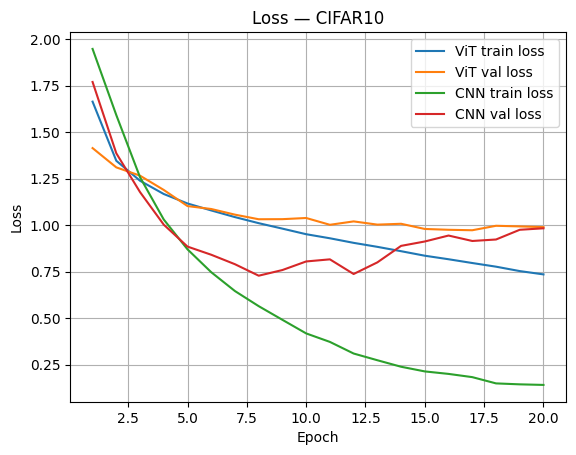

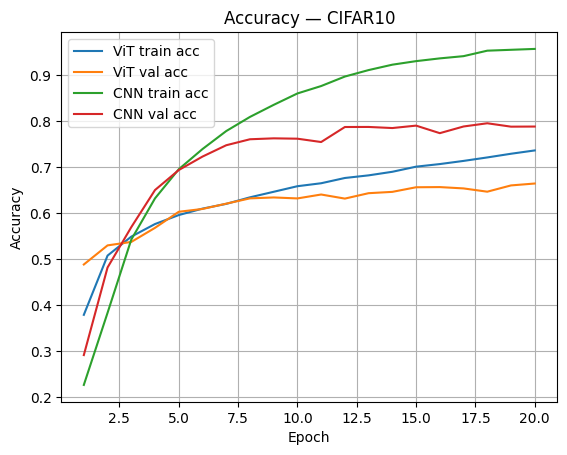

In [70]:
plot_vit_vs_cnn(results_cif, title="CIFAR10")

Ici, nous avons testé sur un plus grand dataset avec des images plus petites et plus nombreuses. A nouveau, les résultats obtenus sont similaires avec de l'overfitting sur les epochs plus grandes.

In [71]:
torch.save(vit_model_cif.state_dict(), "Final_20_epochs_vit_cif.pth")
torch.save(cnn_model_cif.state_dict(), "Final_20_epochs_cnn_cif.pth")

# Inference

In [114]:
def load_model_weights(model, path, device):
    state = torch.load(path, map_location=device)
    model.load_state_dict(state)
    model.to(device)
    model.eval()
    return model

@torch.no_grad()
def predict_top1(model, img_path, transform, classes, device):
    img = Image.open(img_path).convert("RGB")
    x = transform(img).unsqueeze(0).to(device)
    logits = model(x)
    probs = F.softmax(logits, dim=1).squeeze(0)
    p, idx = probs.max(dim=0)
    return classes[int(idx)], float(p)

def show_random_test_predictions(full_ds, test_subset, vit_model, cnn_model, transform, device, n=8, cols=4, title=""):
    classes = full_ds.classes
    idxs = random.sample(test_subset.indices, k=min(n, len(test_subset.indices)))

    rows = (len(idxs) + cols - 1) // cols
    plt.figure(figsize=(4*cols, 4*rows))
    if title:
        plt.suptitle(title, fontsize=16)

    for i, idx in enumerate(idxs):
        img_path, y = full_ds.samples[idx]
        true_class = classes[y]

        vit_pred, vit_p = predict_top1(vit_model, img_path, transform, classes, device)
        cnn_pred, cnn_p = predict_top1(cnn_model, img_path, transform, classes, device)

        img = Image.open(img_path).convert("RGB")

        ax = plt.subplot(rows, cols, i+1)
        ax.imshow(img)
        ax.axis("off")

        ax.set_title(
            f"True: {true_class}\n"
            f"ViT: {vit_pred} ({vit_p:.2f})\n"
            f"CNN: {cnn_pred} ({cnn_p:.2f})",
            fontsize=10
        )

    plt.tight_layout()
    plt.show()

@torch.no_grad()
def predict_top1_from_tensor(model, x, classes, device):
   
    logits = model(x.unsqueeze(0).to(device))       
    probs = F.softmax(logits, dim=1).squeeze(0)     
    p, idx = probs.max(dim=0)
    return classes[int(idx)], float(p)

def denorm_for_display(x, mean=(0.5,0.5,0.5), std=(0.5,0.5,0.5)):
   
    mean = torch.tensor(mean).view(3,1,1)
    std  = torch.tensor(std).view(3,1,1)
    x = x.cpu() * std + mean
    return x.clamp(0, 1)

def show_random_test_predictions_any(test_ds, classes, vit_model, cnn_model,
                                     device, n=8, cols=4, title="",
                                     mean=(0.5,0.5,0.5), std=(0.5,0.5,0.5)):
    idxs = random.sample(range(len(test_ds)), k=min(n, len(test_ds)))
    rows = (len(idxs) + cols - 1) // cols

    plt.figure(figsize=(4*cols, 4*rows))
    if title:
        plt.suptitle(title, fontsize=16)

    for i, j in enumerate(idxs):
        x, y = test_ds[j]  
        true_class = classes[int(y)]

        vit_pred, vit_p = predict_top1_from_tensor(vit_model, x, classes, device)
        cnn_pred, cnn_p = predict_top1_from_tensor(cnn_model, x, classes, device)

        img_disp = denorm_for_display(x, mean=mean, std=std)
        img_disp = img_disp.permute(1,2,0).numpy()

        ax = plt.subplot(rows, cols, i+1)
        ax.imshow(img_disp)
        ax.axis("off")
        ax.set_title(
            f"True: {true_class}\n"
            f"ViT: {vit_pred} ({vit_p:.2f})\n"
            f"CNN: {cnn_pred} ({cnn_p:.2f})",
            fontsize=10
        )

    plt.tight_layout()
    plt.show()

In [123]:


@torch.no_grad()
def get_preds_targets(model, loader, device):
    model.eval()
    preds, targs = [], []
    for x, y in loader:
        x = x.to(device)
        logits = model(x)
        preds.append(logits.argmax(1).cpu().numpy())
        targs.append(y.numpy())
    return np.concatenate(preds), np.concatenate(targs)

def plot_cm_sklearn(model, loader, class_names, device, title=""):
    preds, targs = get_preds_targets(model, loader, device)
    cm = confusion_matrix(targs, preds, labels=list(range(len(class_names))))
    disp = ConfusionMatrixDisplay(cm, display_labels=class_names)
    fig, ax = plt.subplots(figsize=(8, 8))
    disp.plot(ax=ax, xticks_rotation=45, colorbar=True)
    ax.set_title(title)
    plt.tight_layout()
    plt.show()

## Inférence sur le dataset vehicules

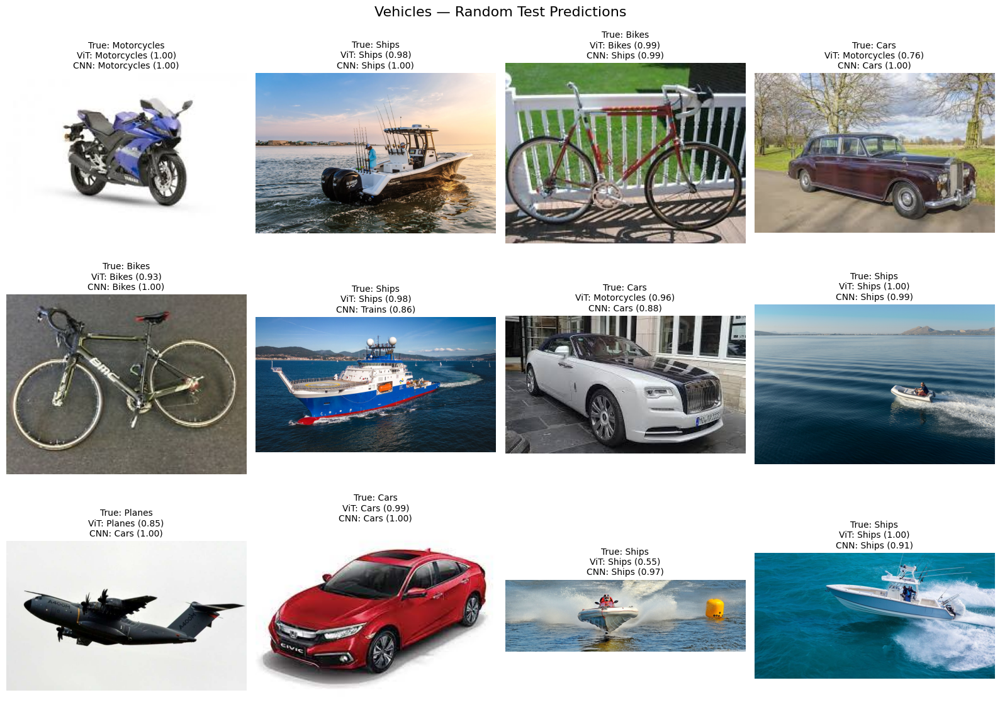

In [113]:
show_random_test_predictions(
    full_ds_v, test_ds_v,
    vit_inf_v, cnn_inf_v,
    transform, device,
    n=12, cols=4,
    title="Vehicles — Random Test Predictions"
)

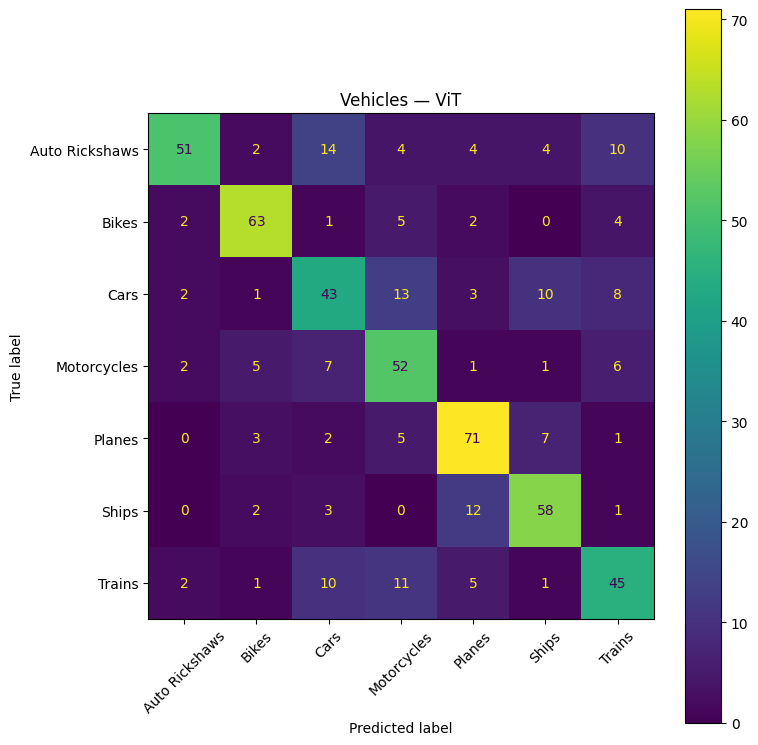

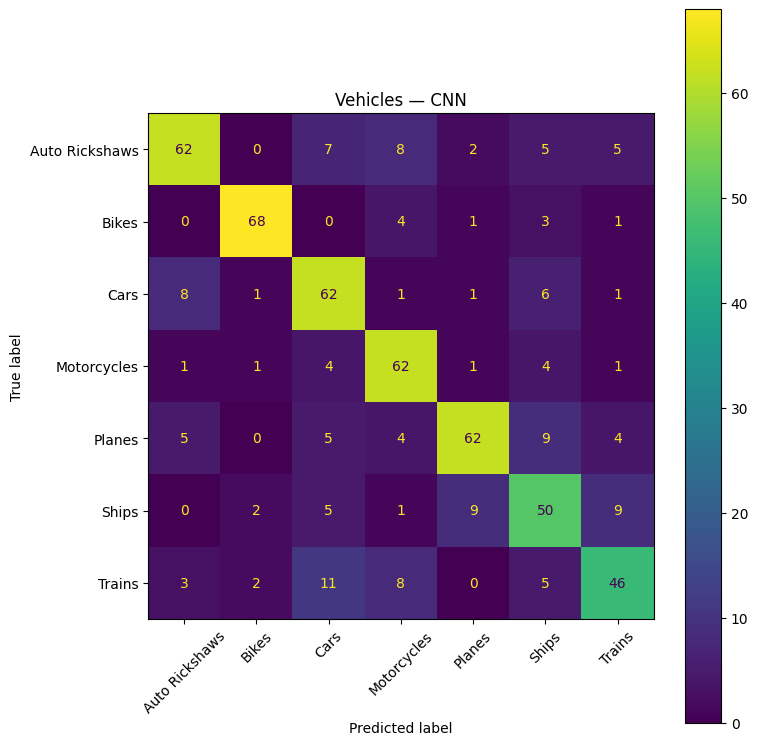

In [124]:
plot_cm_sklearn(vit_inf_v, test_loader_v, full_ds_v.classes, device, title="Vehicles — ViT")
plot_cm_sklearn(cnn_inf_v, test_loader_v, full_ds_v.classes, device, title="Vehicles — CNN")

Au vu des matrices de confusion sur le dataset, certains véhicules sont confondus par les deux modèles.

Pour le ViT, il semble confondre les voitures et les tuk-tuk, alors que le CNN semble confondre les trains avec les voitures. En revanche, on remarque que les deux modèles ne semblent pas faire beaucoup d'erreurs sur les vélos. Ce comportement était prévisible, au vu de l'analyse exploratoire, où nous avons remarqué que les images de vélos sont toutes très similaires.

## Inference sur le dataset garbage

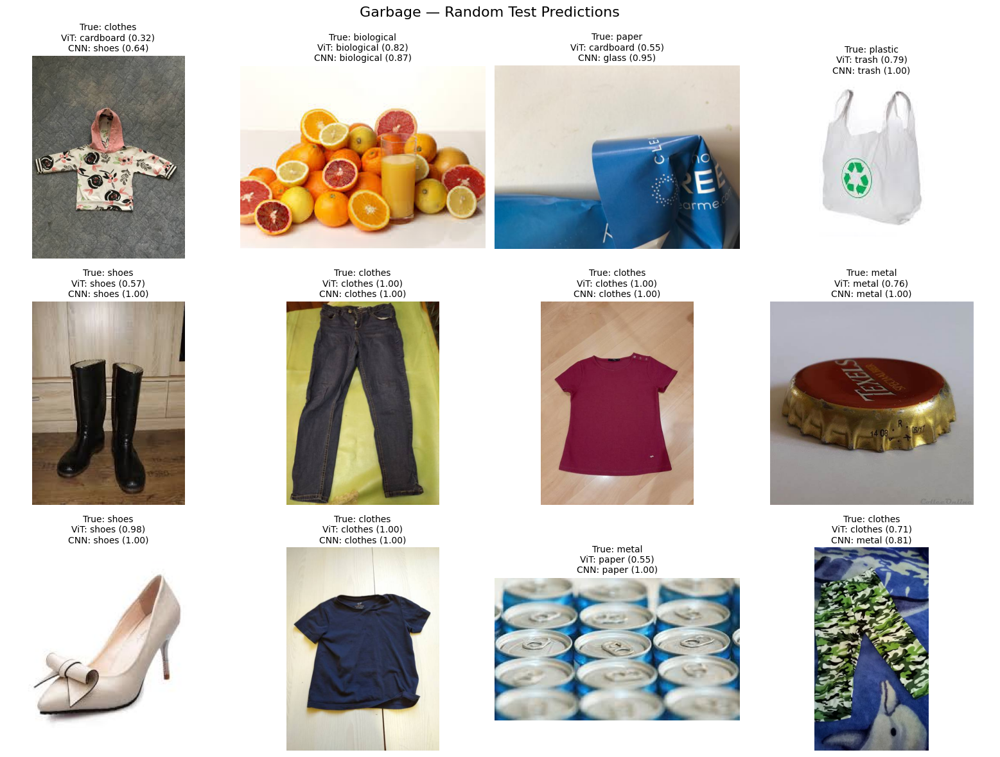

In [112]:
show_random_test_predictions(
    full_ds_gar, test_ds_gar,
    vit_inf_gar, cnn_inf_gar,
    transform, device,
    n=12, cols=4,
    title="Garbage — Random Test Predictions"
)

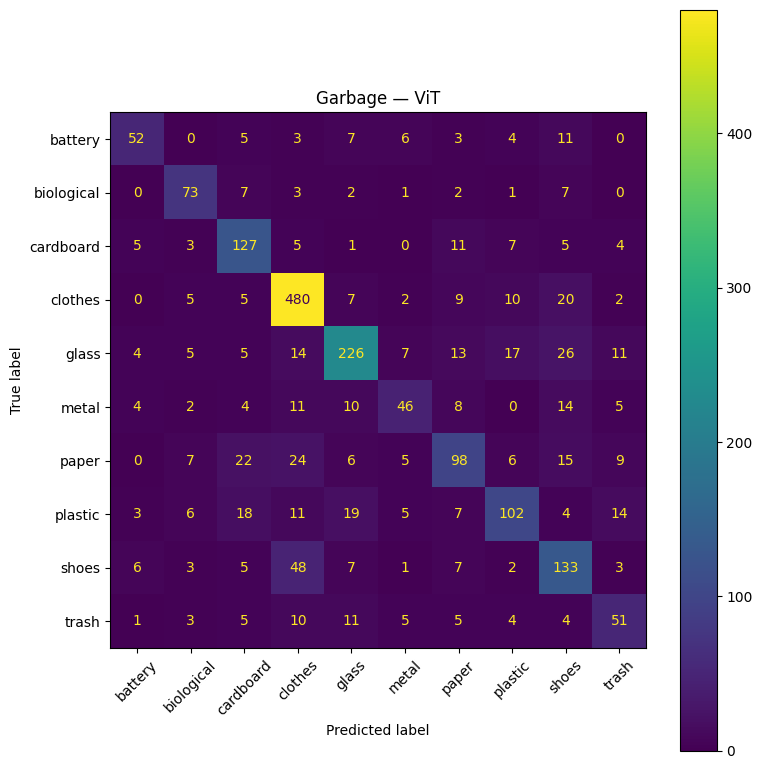

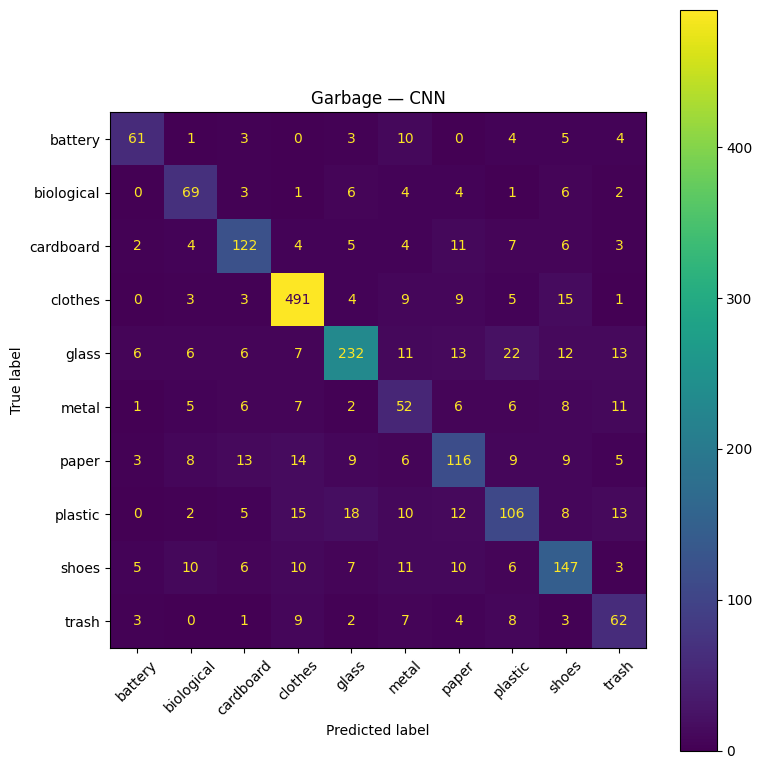

In [125]:
plot_cm_sklearn(vit_inf_gar, test_loader_gar, full_ds_gar.classes, device, title="Garbage — ViT")
plot_cm_sklearn(cnn_inf_gar, test_loader_gar, full_ds_gar.classes, device, title="Garbage — CNN")

En observant les matrices de confusion, les résultats obtenus par le ViT semblent moins précis que ceux obtenus avec le CNN. En effet, dans la globalité, le ViT effectue pas mal d'erreurs, comme nous pouvons le voir en bas à gauche de sa matrice de confusion.

Ces résultats étaient prévisibles au vu de la diversité des images dans une seule classe. Certaines classes se rejoignent beaucoup et ne sont pas forcément bien labelisés. Par exemple, la classe trash peut regrouper l'ensemble des autres données, ce qui peut induire des erreurs dans l'entrainement. 

## Inference sur le dataset CIFAR10

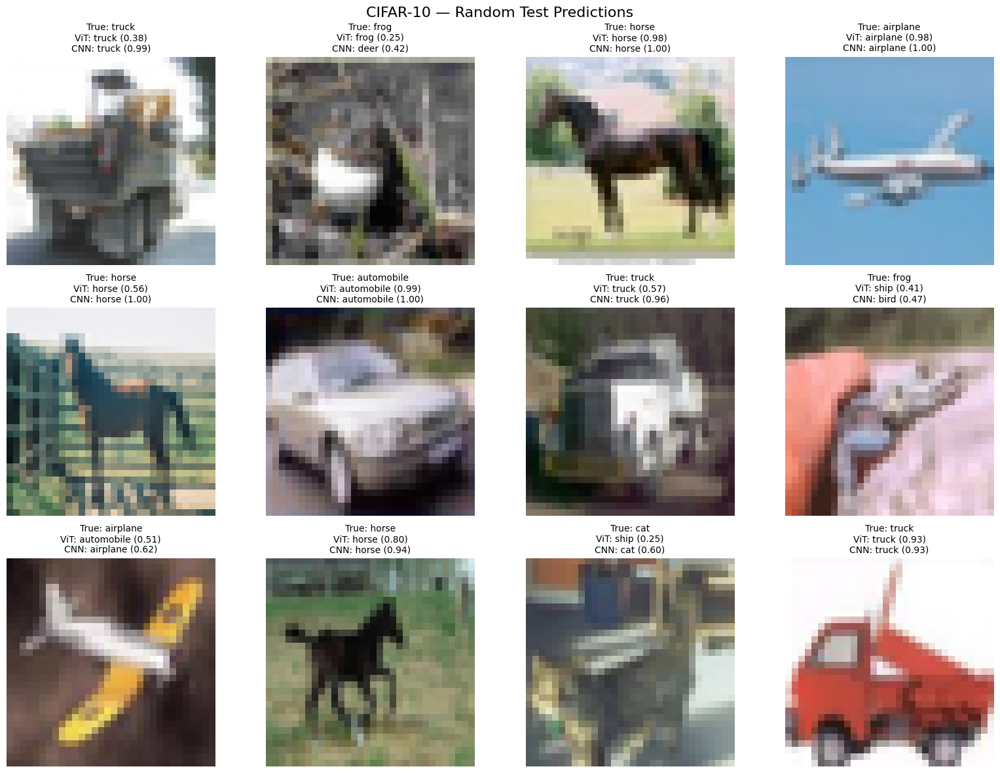

In [109]:
show_random_test_predictions_any(
    test_ds_cif, full_ds_cif.classes,
    vit_inf_cif, cnn_inf_cif,
    device,
    n=12, cols=4,
    title="CIFAR-10 — Random Test Predictions",
    mean=(0.5,0.5,0.5), std=(0.5,0.5,0.5)  
)


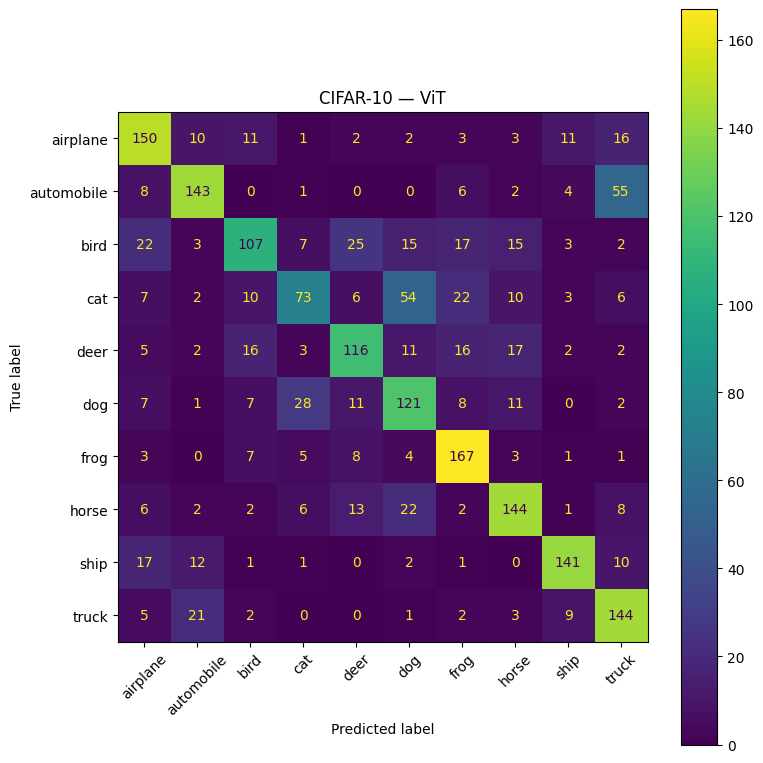

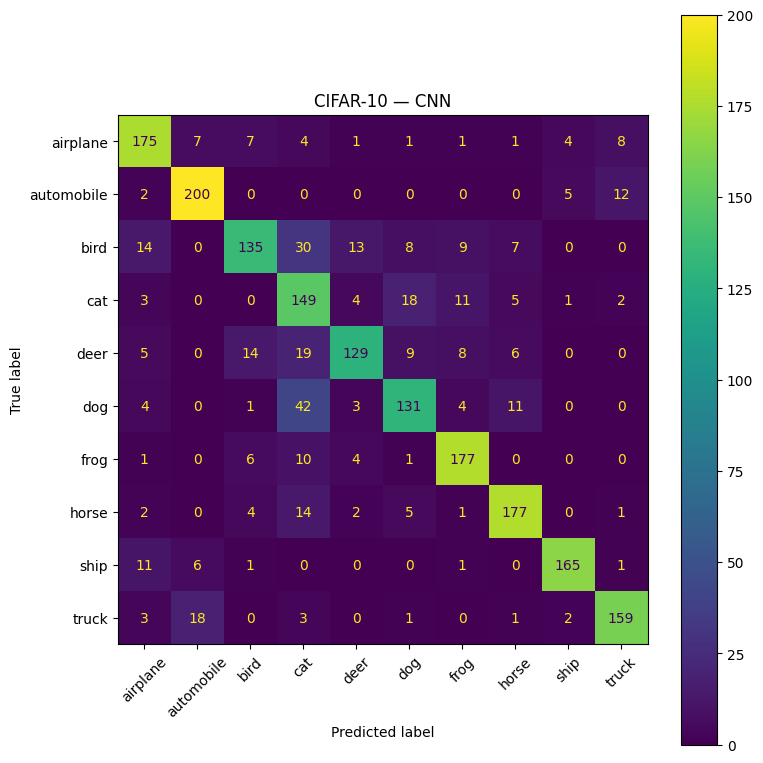

In [126]:
plot_cm_sklearn(vit_inf_cif, test_loader_cif, full_ds_cif.classes, device, title="CIFAR-10 — ViT")
plot_cm_sklearn(cnn_inf_cif, test_loader_cif, full_ds_cif.classes, device, title="CIFAR-10 — CNN")

Ici, malgré le fait que le dataset soit beaucoup plus grand que les deux autres, et que l'on s'attendait à ce que ViT ait des résultats meilleurs que le CNN, c'est ce dernier qui semble le mieux classifier les données. Nous pouvons expliquer ce comportement car les tailles des images sont beaucoup plus petites (32x32). Par conséquent, le CNN aura surement plus de facilité à capter toutes les relations entre les différents pixels de l'image, tandis qu'il n'y a toujours pas assez de données pour que le ViT capte les informations globales de chaque image.

# Comparaison finale 

### Entrainement sur echantillon test

In [89]:
#Benchmark du temps de training et inference 



# Initialisation
vit_model_cif = VisionTransformer(
    patch_size=PATCH_SIZE_CIF, 
    hidden_dim=HIDDEN_DIM, 
    num_heads=NUM_HEADS, 
    num_layers=6, 
    num_classes=NUM_CLASSES_CIF, 
    img_size=IMG_SIZE_CIF,
    dropout=0.2
).to(device)

cnn_model_cif = VGG16CNN(num_classes=NUM_CLASSES_CIF).to(device)

optimizer_vit_cif = torch.optim.AdamW(vit_model_cif.parameters(), lr=3e-4,weight_decay=0.05)
optimizer_cnn_cif = torch.optim.AdamW(cnn_model_cif.parameters(), lr=3e-5, weight_decay=1e-2)
criterion = nn.CrossEntropyLoss()

print("Modèles prêts pour l'entraînement !")



train_times_cnn = []
validation_times_cnn = []
train_images = len(train_loader_cif)
validation_images = len(val_loader_cif)

for epoch in range(5):
    # ---- CNN ----

    e0 = time.perf_counter()
    
    cnn_train_loss, cnn_train_acc = train_epoch(
        cnn_model_cif, train_loader_cif, optimizer_cnn_cif, criterion, device,
        desc=f"CNN train {epoch+1}/{EPOCHS}"
    )

    e1 = time.perf_counter()
    
    cnn_val_loss, cnn_val_acc = evaluate(
        cnn_model_cif, val_loader_cif, criterion, device,
        desc=f"CNN val   {epoch+1}/{EPOCHS}"
    )

    e2 = time.perf_counter()

    train_times_cnn.append(e1-e0)
    validation_times_cnn.append(e2-e1)
    

# 10 epochs

train_times_vit = []
validation_times_vit = []

for epoch in range(5):
    # ---- ViT ----

    e0 = time.perf_counter()
    
    vit_train_loss, vit_train_acc = train_epoch(
        vit_model_cif, train_loader_cif, optimizer_vit_cif, criterion, device,
        desc=f"ViT train {epoch+1}/{EPOCHS}"
    )

    e1 = time.perf_counter()
    
    vit_val_loss, vit_val_acc = evaluate(
        vit_model_cif, val_loader_cif, criterion, device,
        desc=f"ViT val   {epoch+1}/{EPOCHS}"
    )

    e2 = time.perf_counter()

    train_times_vit.append(e1-e0)
    validation_times_vit.append(e2-e1)


Modèles prêts pour l'entraînement !


CNN train 1/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   1/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 2/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   2/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 3/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   3/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 4/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   4/20:   0%|          | 0/250 [00:00<?, ?it/s]

CNN train 5/20:   0%|          | 0/1563 [00:00<?, ?it/s]

CNN val   5/20:   0%|          | 0/250 [00:00<?, ?it/s]

ViT train 1/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   1/20:   0%|          | 0/250 [00:00<?, ?it/s]

ViT train 2/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   2/20:   0%|          | 0/250 [00:00<?, ?it/s]

ViT train 3/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   3/20:   0%|          | 0/250 [00:00<?, ?it/s]

ViT train 4/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   4/20:   0%|          | 0/250 [00:00<?, ?it/s]

ViT train 5/20:   0%|          | 0/1563 [00:00<?, ?it/s]

ViT val   5/20:   0%|          | 0/250 [00:00<?, ?it/s]

In [96]:
### Benchmark du temps de training et inference ! ###
### --------------------------------------------- ###



# Initialisation
vit_model_gar = VisionTransformer(
    patch_size=PATCH_SIZE, 
    hidden_dim=HIDDEN_DIM, 
    num_heads=NUM_HEADS, 
    num_layers=6, 
    num_classes=NUM_CLASSES_GAR, 
    img_size=IMG_SIZE_GAR,
    dropout=0.2
).to(device)

cnn_model_gar = VGG16CNN(num_classes=NUM_CLASSES_GAR,img_size=IMG_SIZE_GAR).to(device)

# Exemple de configuration d'entraînement
optimizer_vit_gar = torch.optim.AdamW(vit_model_gar.parameters(), lr=3e-4, weight_decay=0.05)
optimizer_cnn_gar = torch.optim.AdamW(cnn_model_gar.parameters(), lr=3e-5, weight_decay=1e-2)
criterion = nn.CrossEntropyLoss()

print("Modèles prêts pour l'entraînement !")


# 10 epochs

train_times_cnn_gar = []
validation_times_cnn_gar = []
train_images_gar = len(train_loader_cif)
validation_images_gar = len(val_loader_cif)

for epoch in range(5):
    # ---- CNN ----

    e0 = time.perf_counter()
    
    cnn_train_loss, cnn_train_acc = train_epoch(
        cnn_model_gar, train_loader_gar, optimizer_cnn_gar, criterion, device,
        desc=f"CNN train {epoch+1}/{EPOCHS}"
    )

    e1 = time.perf_counter()
    
    cnn_val_loss, cnn_val_acc = evaluate(
        cnn_model_gar, val_loader_gar, criterion, device,
        desc=f"CNN val   {epoch+1}/{EPOCHS}"
    )

    e2 = time.perf_counter()

    train_times_cnn_gar.append(e1-e0)
    validation_times_cnn_gar.append(e2-e1)


train_times_vit_gar = []
validation_times_vit_gar = []

for epoch in range(5):
    # ---- ViT ----

    e0 = time.perf_counter()
    
    vit_train_loss, vit_train_acc = train_epoch(
        vit_model_gar, train_loader_gar, optimizer_vit_gar, criterion, device,
        desc=f"ViT train {epoch+1}/{EPOCHS}"
    )

    e1 = time.perf_counter()
    
    vit_val_loss, vit_val_acc = evaluate(
        vit_model_gar, val_loader_gar, criterion, device,
        desc=f"ViT val   {epoch+1}/{EPOCHS}"
    )

    e2 = time.perf_counter()

    train_times_vit_gar.append(e1-e0)
    validation_times_vit_gar.append(e2-e1)

Modèles prêts pour l'entraînement !


CNN train 1/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val   1/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 2/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val   2/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 3/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val   3/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 4/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val   4/20:   0%|          | 0/64 [00:00<?, ?it/s]

CNN train 5/20:   0%|          | 0/506 [00:00<?, ?it/s]

CNN val   5/20:   0%|          | 0/64 [00:00<?, ?it/s]

ViT train 1/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val   1/20:   0%|          | 0/64 [00:00<?, ?it/s]

ViT train 2/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val   2/20:   0%|          | 0/64 [00:00<?, ?it/s]

ViT train 3/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val   3/20:   0%|          | 0/64 [00:00<?, ?it/s]

ViT train 4/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val   4/20:   0%|          | 0/64 [00:00<?, ?it/s]

ViT train 5/20:   0%|          | 0/506 [00:00<?, ?it/s]

ViT val   5/20:   0%|          | 0/64 [00:00<?, ?it/s]

### Comparaison finale

In [90]:
@torch.no_grad()
def eval_loss_acc(model, loader, device):
    model.eval()
    total_loss, total_correct, total = 0.0, 0, 0

    for x, y in loader:
        x = x.to(device)
        y = y.to(device).long()
        logits = model(x)
        loss = F.cross_entropy(logits, y)

        total_loss += loss.item() * y.size(0)
        total_correct += (logits.argmax(1) == y).sum().item()
        total += y.size(0)

    return total_loss / total, total_correct / total

def build_summary_table(device):
    rows = []



    # ===== Vehicles =====
    v_vit_loss, v_vit_acc = eval_loss_acc(vit_inf_v, test_loader_v, device)
    v_cnn_loss, v_cnn_acc = eval_loss_acc(cnn_inf_v, test_loader_v, device)
    rows += [
        {"Dataset": "Vehicles", "Image Size": "128x128", "Model": "ViT", "Test Loss": v_vit_loss, "Test Acc": v_vit_acc},
        {"Dataset": "Vehicles", "Image Size": "128x128", "Model": "CNN (VGG16-style)", "Test Loss": v_cnn_loss, "Test Acc": v_cnn_acc},
    ]

    # ===== Garbage =====
    g_vit_loss, g_vit_acc = eval_loss_acc(vit_inf_gar, test_loader_gar, device)
    g_cnn_loss, g_cnn_acc = eval_loss_acc(cnn_inf_gar, test_loader_gar, device)
    rows += [
        {"Dataset": "Garbage", "Image Size": "128x128", "Model": "ViT", "Test Loss": g_vit_loss, "Test Acc": g_vit_acc},
        {"Dataset": "Garbage", "Image Size": "128x128", "Model": "CNN (VGG16-style)", "Test Loss": g_cnn_loss, "Test Acc": g_cnn_acc},
    ]

    # ===== CIFAR10 =====
    c_vit_loss, c_vit_acc = eval_loss_acc(vit_inf_cif, test_loader_cif, device)
    c_cnn_loss, c_cnn_acc = eval_loss_acc(cnn_inf_cif, test_loader_cif, device)
    rows += [
        {"Dataset": "CIFAR-10", "Image Size": "32x32", "Model": "ViT", "Test Loss": c_vit_loss, "Test Acc": c_vit_acc},
        {"Dataset": "CIFAR-10", "Image Size": "32x32", "Model": "CNN (VGG16-style)", "Test Loss": c_cnn_loss, "Test Acc": c_cnn_acc},
    ]

    df = pd.DataFrame(rows)


    df["Test Loss"] = df["Test Loss"].map(lambda x: round(x, 4))
    df["Test Acc"]  = df["Test Acc"].map(lambda x: round(100*x, 2))  # en %

    return df

summary_df = build_summary_table(device)
summary_df

,Dataset,Image Size,Model,Test Loss,Test Acc
0,Vehicles,128x128,ViT,1.1303,68.39
1,Vehicles,128x128,CNN (VGG16-style),1.6992,73.57
2,Garbage,128x128,ViT,1.0035,68.64
3,Garbage,128x128,CNN (VGG16-style),1.7286,72.11
4,CIFAR-10,32x32,ViT,0.9839,65.30
5,CIFAR-10,32x32,CNN (VGG16-style),0.9887,79.85


On remarque que dans les trois cas, le CNN performe mieux que le Vit. Plus le dataset choisi est de taille conséquente, meilleur est la performance du CNN. En effet, on passe de 74% de précision pour vehicles à 80% pour CIFAR-10 pour les CNN. Dans le cas des ViT, on oscille autour des 67% de précision. Cela nous montre bien que les CNN peuvent être performants pour de la classification puisque avec un dataset assez grand, la précision semble aussi s'améliorer. Pour le ViT, on ne retrouve pas cette dynamique. Au vu des résultats obtenus, il semblerait plutôt cohérent de choisir une architecture CNN plutôt que ViT pour faire de la classification d'images.

In [97]:
print(f"training on {50000} images")
print(f"inference/validation on {8000} images")
df = pd.DataFrame([
    {
        "Dataset": "CIFAR-10",
        "Model": "ViT",
        "First Epoch Train Time": train_times_vit[0],
        "Avg Epoch Train Time": sum(train_times_vit[1:]) / len(train_times_vit[1:]),
        "Avg Inference Time": sum(validation_times_vit) / len(validation_times_vit),
        "Parameters": "4 771 082"
    },
    {
        "Dataset": "CIFAR-10",
        "Model": "CNN",
        "First Epoch Train Time": train_times_cnn[0],
        "Avg Epoch Train Time": sum(train_times_cnn[1:]) / len(train_times_cnn[1:]),
        "Avg Inference Time": sum(validation_times_cnn) / len(validation_times_cnn),
        "Parameters": "33 638 218"
    },
    {
        "Dataset": "GARBAGE",
        "Model": "ViT",
        "First Epoch Train Time": train_times_vit_gar[0],
        "Avg Epoch Train Time": sum(train_times_vit_gar[1:]) / len(train_times_vit_gar[1:]),
        "Avg Inference Time": sum(validation_times_vit_gar) / len(validation_times_vit_gar),
        "Parameters": "4,954,631"
    },
    {
        "Dataset": "GARBAGE",
        "Model": "CNN",
        "First Epoch Train Time": train_times_cnn_gar[0],
        "Avg Epoch Train Time": sum(train_times_cnn_gar[1:]) / len(train_times_cnn_gar[1:]),
        "Avg Inference Time": sum(validation_times_cnn_gar) / len(validation_times_cnn_gar),
        "Parameters": "65,083,207"
    }
])
df

training on 50000 images
inference/validation on 8000 images


,Dataset,Model,First Epoch Train Time,Avg Epoch Train Time,Avg Inference Time,Parameters
0,CIFAR-10,ViT,62.526545,61.686877,5.895818,4 771 082
1,CIFAR-10,CNN,68.715469,63.929931,5.185724,33 638 218
2,GARBAGE,ViT,60.030131,60.262587,6.632911,"4,954,631"
3,GARBAGE,CNN,116.825284,113.198578,8.654802,"65,083,207"


Pour ce qui est du temps d'entraînement, l'architecture ViT surpasse dans tous les cas l'architecture CNN. Sur le dataset CIFAR, l'entrainement sur une epoch est en moyenne deux secondes plus rapide pour le ViT que pour le CNN. Dans le cas du dataset garbage, il y a un réel gain de temps : le ViT s'entraine quasiment deux fois plus vite que le CNN. Pour ce qui est du temps d'inférence, les résultats obtenus sont relativement similaires.
Le ViT est bien moins gourmand en espace de stockage que le CNN : les modèles de ViT entrainés sur CIFAR et garbage ont en moyenne autour de 5 millions de paramètres tandis que les CNN entraînés sur CIFAR et garbage ont respectivement 33 et 65 millions de paramètres.
Si le temps d'entrainement est une variable importante à prendre en compte, il peut être intéressant de considérer les architectures ViT même si dans ce cas la, la précision n'est pas sacrifiable.

# Comparaison avec la littérature

Nous avons regardé plusieurs articles pour comparer les performances des architectures ViT et CNN. D’après un des articles fondateurs de la mode des Visual Tranformers « An Image is worth 16x16 Words : Transformers for image recognition at scale », ce type de modèle est très performant dans le domaine de la classification d’images, mais à des échelles différentes des CNN.


Dans un premier temps, le CNN est plus hiérarchique. Il commence par remarquer les détails plus petits grâce à ses noyaux de convolution, puis empiler les différentes couches pour comprendre l’objet entier de l’image. Au contraire, le Visual Transformer, grâce à son mécanisme de self-attention, interprète les liens entre chaque patch de l’image pour comprendre la structure d’ensemble de l’image dès la première couche du réseau. Ainsi, ViT se démarque par sa capacité à capter les relations spatiales gloables complexes, alors que le CNN est meilleur pour capter les détails précis comme les bords ou les textures.


Ensuite, le CNN arrive à apprendre beaucoup plus vite sur des jeux de données petits, âce à la convolution qui permet d’établir des relations entre les pixels proches, et grâce à son insensibilité aux translations. Il s’agit d’un biais inductif. Tandis que pour le ViT, le modèle doit tout apprendre par lui même, grâce à de très gros datasets pour capter le lien entre les pixels proches. Ainsi, avec des petits datasets, le CNN sera bien meilleur puisque le ViT va overfitter rapidement, alors que pour de gros datasets, le ViT sera plus performant.


Finalement, concernant la complexité, celle du CNN est linéaire et dépend de la taille de l’image fournie. Par exemple, en doublant la résolution, le calcul double également. Quant au ViT, il dispose d’une complexité quadratique. Ainsi, en divisant l’image en patch deux fois plus petits, l’attention sera multipliée par 16.

Nos résultats ne sont pas vraiment en accord avec les affirmations énoncées par la littérature. Cela est probablement du au fait que nos datasets ne sont pas assez complexes. En effet, la littérature considère que les architecture ViT peuvent dépasser les CNN pour des datasets d'entrainement de plusieurs millions d'images.

# Explainability - Bonus

In [136]:
from captum.attr import Saliency
from captum.attr import IntegratedGradients, LayerGradCam
from captum.attr import visualization as viz
def denormalize(tensor):
    return tensor * 0.5 + 0.5

In [146]:
def plot_integrated_gradients(model, dataset, index):
    model.eval()
    image, label = dataset[index]
    input_tensor = image.unsqueeze(0).to(device)

   
    classes = dataset.classes if hasattr(dataset, 'classes') else dataset.dataset.classes

 
    ig = IntegratedGradients(model)
    attr_ig, delta = ig.attribute(input_tensor, target=label, return_convergence_delta=True)
    
    img_plt = np.transpose(denormalize(image).cpu().numpy(), (1, 2, 0))
    attr_ig_plt = np.transpose(attr_ig.squeeze(0).cpu().detach().numpy(), (1, 2, 0))

    print(f"Superposition IG ViT | Classe : {classes[label]}")

    viz.visualize_image_attr_multiple(
        attr_ig_plt, 
        img_plt, 
        ["original_image", "blended_heat_map"], 
        ["all", "positive"], 
        show_colorbar=True,
        titles=["Image Originale", "Zones d'Intérêt ViT (IG)"]
    )
def plot_saliency(model, dataset, index):
    model.eval()
    image, label = dataset[index]
    input_tensor = image.unsqueeze(0).to(device)

   
    classes = dataset.classes if hasattr(dataset, 'classes') else dataset.dataset.classes

    
    saliency = Saliency(model)
    grads = saliency.attribute(input_tensor, target=label)
    
    
    img_plt = np.transpose(denormalize(image).cpu().numpy(), (1, 2, 0))
   
    grads_plt = np.transpose(grads.squeeze(0).cpu().detach().numpy(), (1, 2, 0))

    print(f"Superposition Saliency | Classe : {classes[label]}")

  
    viz.visualize_image_attr_multiple(
        grads_plt, 
        img_plt, 
        ["original_image", "blended_heat_map"], 
        ["all", "absolute_value"], 
        cmap="jet",
        show_colorbar=True,
        titles=["Image Originale", "Zones d'Intérêt Superposées"]
    )


Analyse de l'image d'indice 1655 | Classe réelle : automobile
Prédiction CNN : cat
Superposition Saliency | Classe : automobile


/home/fonsecag/.conda/envs/HDDLtorch/lib/python3.12/site-packages/captum/attr/_core/saliency.py:129: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)


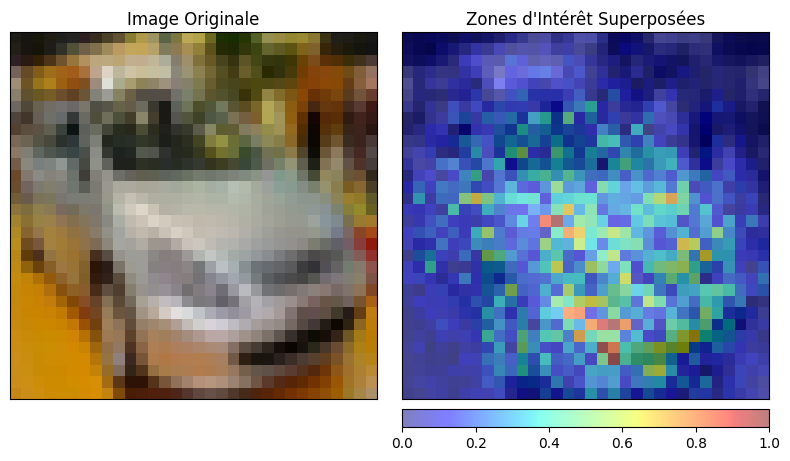

Prédiction ViT : automobile
Superposition Saliency | Classe : automobile


/home/fonsecag/.conda/envs/HDDLtorch/lib/python3.12/site-packages/captum/attr/_core/saliency.py:129: UserWarning: Input Tensor 0 did not already require gradients, required_grads has been set automatically.
  gradient_mask = apply_gradient_requirements(inputs_tuple)


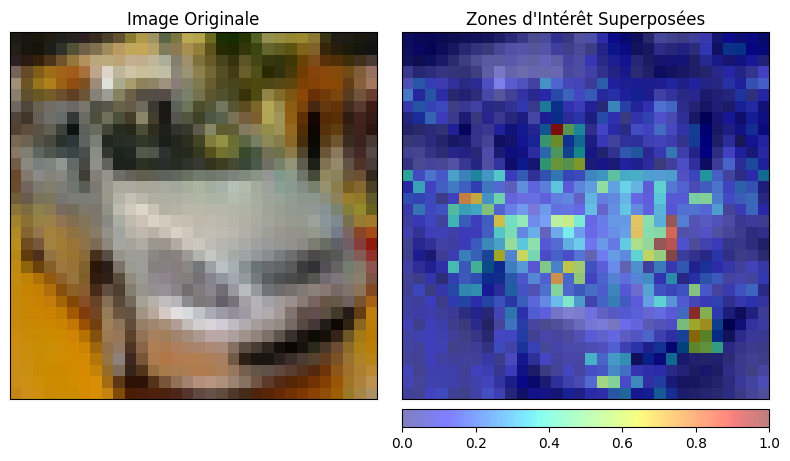

In [153]:

idx = np.random.randint(len(test_ds_cif))
image, label = test_ds_cif[idx]

print(f"Analyse de l'image d'indice {idx} | Classe réelle : {full_ds_cif.classes[label]}")


model_cnn = cnn_model_cif.to(device)
output_cnn = model_cnn(image.unsqueeze(0).to(device))
pred_cnn = output_cnn.argmax(dim=1).item()
print(f"Prédiction CNN : {full_ds_cif.classes[pred_cnn]}")


plot_saliency(cnn_model_cif, test_ds_cif, idx)


model_vit = vit_model_cif.to(device)
output_vit = model_vit(image.unsqueeze(0).to(device))
pred_vit = output_vit.argmax(dim=1).item()
print(f"Prédiction ViT : {full_ds_cif.classes[pred_vit]}")

plot_saliency(vit_model_cif, test_ds_cif, idx)



Les architectures ViT et CNN étant radicalement différentes, on ne peut pas utiliser des mêmes méthodes d'interprétabilité spécifiques à une architecture comme grad-cam (cette méthode étant adapté pour les CNN). On utilise vanilla gradient : on rétropropage le gradient du mécanisme de décision de classe par rapport aux pixels de l'image. Ainsi, un gradient important pour un pixel donné semble indiquer que ce pixel est particulièrement important dans le mécanisme de décision.

Ici, on a l'impression que le CNN percoit l'objet dans sa globalité : les pixels importants (en rouge) dans le mécanisme de classification semblent être répartis sur toute la voiture. Pour le ViT, les pixels ayant de l'importance semblent être moins spécifique à la voiture mais à de petits détails. Ainsi, il est compliqué plus compliqué d'expliquer réellement le mécanisme de décision du ViT que celui du CNN.

# Conclusion

Pour conclure, nous avons testé deux architectures de deep learning différentes sur une tâche de classification d'images sur 3 datasets de taille et sur des sujets différents. Après entraînement et évaluation, nous avons remarqué que l'architecture CNN est plus performante que le ViT sur ces datasets ce qu'on aurait pu prévoir car les datasets ne sont pas de taille assez conséquente et nous n'avons également pas la puissance de calcul pour entraîner des modèles sur des très grands dataset pendant un grand nombre d'epochs.
Nous aurions pu approfondir nos recherche en expérimentant d'autres méthodes telles que la data augmentation ou la variation des hyper-paramètres.